1) weekdays vs weekends analysis;
2) holiday analysis;
3) product structure analysis;
4) promotion analysis


计算同比、环比增长率，观察增长或下滑的时间点。

旺季与淡季？（如冬天哪些热饮销量上涨？）

特定节假日促销效应？（如春节、感恩节等是否带动销量？带动了哪些产品的销量？）

产品销售结构分析： 畅销 vs 滞销产品（趋势图&产品系列占比图） 是否某些产品过度依赖促销？

不同产品系列的交叉销售情况（是否买A的人更可能买B？）

# 0. Preprocessing

In [1]:
import pandas as pd
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns (optional)
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates
import warnings
from collections import Counter
import matplotlib.cm as cm

# Suppress FutureWarning for deprecated option
warnings.filterwarnings("ignore", category=FutureWarning, message="use_inf_as_na option is deprecated")

In [110]:
df = pd.read_csv('Sales Breakdown Data/Sales by Dishes & Customizations (With Category) 2023-2025.csv').iloc[:,1:]
df['Date'] = pd.to_datetime(df['Date'])
df['Dishes & Customizations Breakdown'] = df['Dishes & Customizations Breakdown'].apply(lambda x: x.replace('balll','ball'))

In [111]:
df['YearMonth'] = df['Date'].dt.to_period('M').astype(str)

In [112]:
replacements = {
    r'^rice balls \(8 pieces\)$': 'rice ball (8 pcs)',
    r'^rice ball \(8 pcs\)$':'rice ball (8pcs)',
    r'^taro balls \(10 pieces\)$': 'taro ball (10pcs)',
    r'potaro balls \(5 pieces\)': 'sweet potato taro ball (5pcs)',
    r'^red beans \(1 spoon\)$': 'red bean (1 spoon)',
    r'lychee jelly$': 'lychee jelly (1 scoop)',
    r'^melon jelly \(1 slice\)$': 'melon jelly (1 scoop)',
    r'^caramel pudding \(1 piece\)$': 'caramel pudding (1 spoon)',
    r'^sesame rice balls \(2 pieces\)$': 'sesame rice ball (2pcs)',
    r'^peanuts \(1 spoon\)$': 'peanut (1 spoon)',
    r'taro paste$': 'taro paste (1 scoop)',
    r'ice cream$': 'ice cream (1 scoop)',
    r'^almond pudding \(1 piece\)$': 'almond pudding (1pcs)',
    r'grass jelly$': 'grass jelly (1 slice)',
    r'black sugar boba$': 'black sugar boba (1 spoon)',
    r'^q mochi\(2pcs\)$': 'q mochi (2pcs)',
    r'q mochi \(2 pieces\)': 'q mochi (2pcs)',
    r'^taro \(2 pieces\)$': 'taro (2pcs)',
    r'^mini taro ball$': 'mini q (1 scoop)',
    r'^normal$':'normal ice'
}

def clean_text(text):
    text = text.strip()
    for pattern, replacement in replacements.items():
        text = re.sub(pattern, replacement, text)
    return text

df['Dishes & Customizations Breakdown'] = df['Dishes & Customizations Breakdown'].apply(clean_text)

In [113]:
df.head(20)

,Date,Dishes & Customizations Breakdown,Count,Gross Sales,Type,Associated Dish,Category,YearMonth
0,2023-01-01,icy grass jelly signature,28,262.50,Dish,icy grass jelly signature,our signature series,2023-01
1,2023-01-01,taro paste (1 scoop),4,5.00,Customization,icy grass jelly signature,customization,2023-01
2,2023-01-01,caramel pudding (1 spoon),3,3.75,Customization,icy grass jelly signature,customization,2023-01
3,2023-01-01,grass jelly (1 slice),3,2.25,Customization,icy grass jelly signature,customization,2023-01
4,2023-01-01,sesame rice ball (2pcs),2,2.50,Customization,icy grass jelly signature,customization,2023-01
5,2023-01-01,boba (1 spoon),2,1.50,Customization,icy grass jelly signature,customization,2023-01
6,2023-01-01,melon jelly (1 scoop),2,1.50,Customization,icy grass jelly signature,customization,2023-01
7,2023-01-01,almond pudding (1pcs),1,1.25,Customization,icy grass jelly signature,customization,2023-01
8,2023-01-01,ice cream (1 scoop),1,1.25,Customization,icy grass jelly signature,customization,2023-01
9,2023-01-01,taro ball (10pcs),1,1.25,Customization,icy grass jelly signature,customization,2023-01


In [6]:
total_sales = df[df['Associated Dish']=='total sales'][['Date','Count','Gross Sales']].reset_index(drop=True)
total_sales['Date'] = pd.to_datetime(total_sales['Date'])
total_sales.head(10)

,Date,Count,Gross Sales
0,2023-01-01,198,1649.40
1,2023-01-02,133,1075.32
2,2023-01-03,58,509.34
3,2023-01-04,54,414.01
4,2023-01-05,85,694.44
5,2023-01-06,92,775.85
6,2023-01-07,114,947.26
7,2023-01-08,84,676.51
8,2023-01-09,44,335.89
9,2023-01-10,38,308.23


In [7]:
def search_count(keyword):
    return df[df['Dishes & Customizations Breakdown'].str.contains(keyword)].groupby('Associated Dish')['Count'].sum().sort_values(ascending=False)

def get_percentage(data):
    return [size / sum(data) * 100 for size in data.values]

def search_monthly_count(keyword):
    return df[df['Dishes & Customizations Breakdown'].str.contains(keyword)].groupby(['Associated Dish','YearMonth'])['Count'].sum().sort_values(ascending=False)

In [8]:
df_dish = df[(df['Type']=='Dish') & (df['Dishes & Customizations Breakdown'] != 'total sales')]
df_cust = df[df['Type']=='Customization']

# 1. Overview

## 1.1 Sales Trend

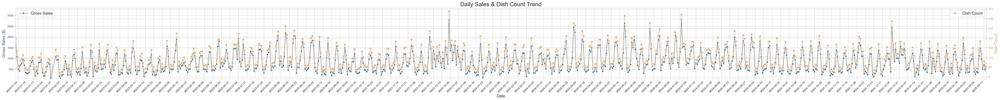

In [9]:
# Set Seaborn style
sns.set_style("whitegrid")

# Create figure and axes
fig, ax1 = plt.subplots(figsize=(60, 5))

color1 = '#2A628F'
color2 = '#F4A261'

# First Line: Gross Sales (Primary Y-Axis)
ax1.set_xlabel('Date', fontsize=14)
ax1.set_ylabel('Gross Sales ($)', fontsize=14, color=color1)
sns.lineplot(x=total_sales['Date'], y=total_sales['Gross Sales'], 
             marker='d', linewidth=1, linestyle='-', markersize=6, color=color1, ax=ax1, label='Gross Sales') # Add label for legend
ax1.tick_params(axis='y', labelcolor=color1)

# Adjust Y-limits to spread the lines apart
ax1.set_ylim(min(total_sales['Gross Sales']) * 0.8, max(total_sales['Gross Sales']) * 1.2)


# Create a secondary y-axis
ax2 = ax1.twinx()
ax2.set_ylabel('Dish Count', fontsize=14, color=color2)
sns.lineplot(x=total_sales['Date'], y=total_sales['Count'], 
             marker='s', linewidth=1, linestyle='--', markersize=6, color=color2, ax=ax2, label='Dish Count') # Add label for legend
ax2.tick_params(axis='y', labelcolor=color2)

# Title
plt.title('Daily Sales & Dish Count Trend', fontsize=20)

# Adjust x-axis ticks to show fewer labels
ax1.xaxis.set_major_locator(mdates.DayLocator(interval=7))  # Show every 7 days (adjust as needed)
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # Format date

# Set the x-axis limits to match the desired date range
ax1.set_xlim(pd.to_datetime('2023-01-01'), pd.to_datetime('2025-03-13'))

# Force x-axis labels to rotate
fig.autofmt_xdate(rotation=45)  # Ensures labels rotate properly

# Add Legends (Positioning them correctly)
ax1.legend(loc='upper left', fontsize=14)
ax2.legend(loc='upper right', fontsize=14)

# Show Plot
plt.show()

## 1.2 Product Popularity Overall

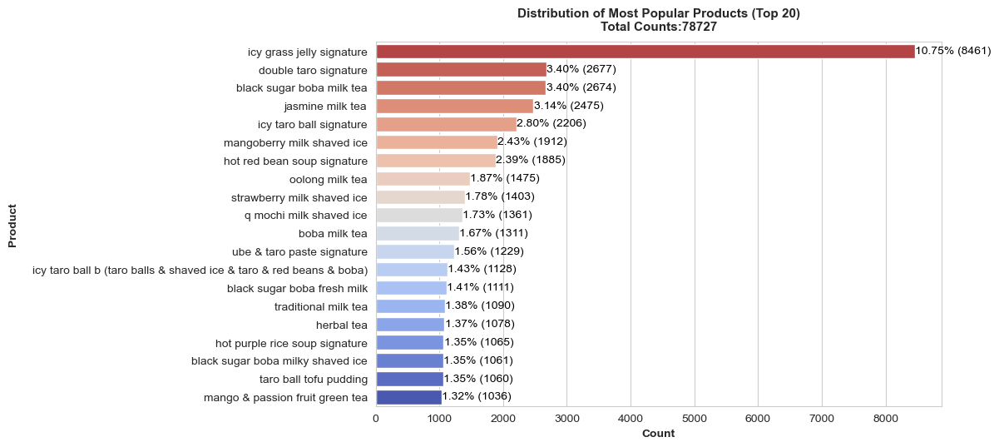

In [91]:
product_count = df_dish.groupby('Dishes & Customizations Breakdown')['Count'].sum().sort_values(ascending=False)
data = product_count[:20]
data_percentages = get_percentage(product_count)[:20]

plt.figure(figsize=(12,10))
plt.subplot(2, 1, 1)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Most Popular Products (Top 20)\nTotal Counts:{sum(product_count)}",fontsize=11, fontweight="bold", pad=10)


plt.tight_layout()
plt.show()

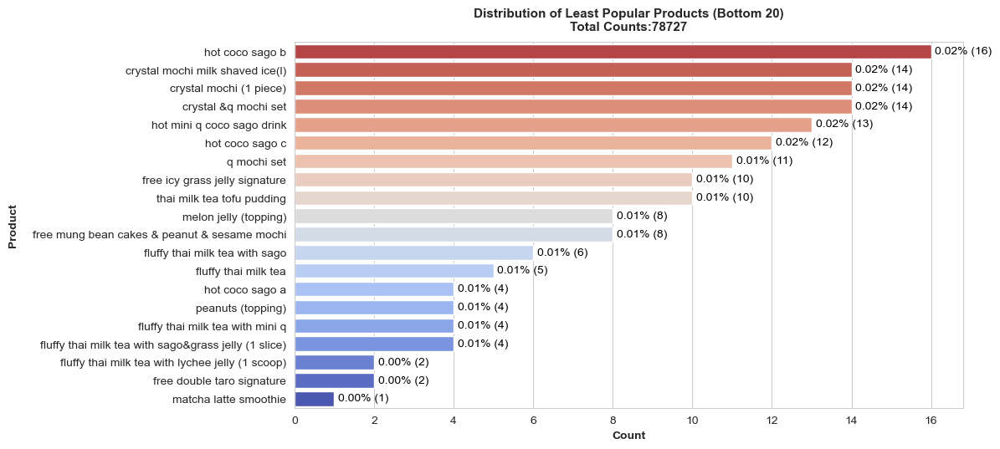

In [92]:
product_count = df_dish.groupby('Dishes & Customizations Breakdown')['Count'].sum().sort_values(ascending=False)
data = product_count[-20:]
data_percentages = get_percentage(product_count)[-20:]

plt.figure(figsize=(12,10))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size+0.1, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Least Popular Products (Bottom 20)\nTotal Counts:{sum(product_count)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

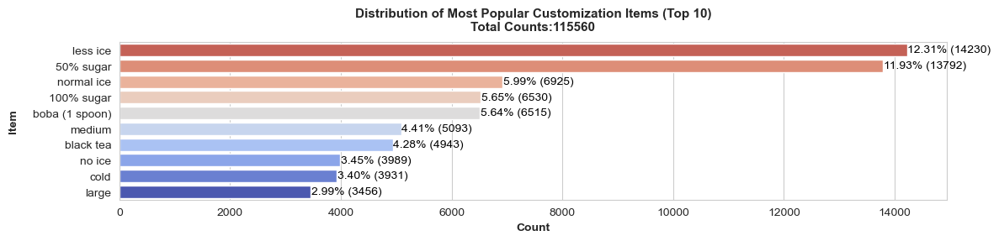

In [98]:
cust_count = df_cust.groupby('Dishes & Customizations Breakdown')['Count'].sum().sort_values(ascending=False)
data = cust_count[:10]
data_percentages = get_percentage(cust_count)[:10]

plt.figure(figsize=(12,5))
plt.subplot(2, 1, 1)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Item", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Most Popular Customization Items (Top 10)\nTotal Counts:{sum(cust_count)}",fontsize=11, fontweight="bold", pad=10)


plt.tight_layout()
plt.show()

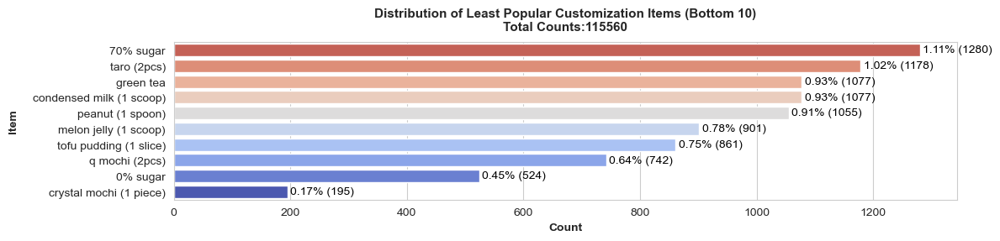

In [99]:
cust_count = df_cust.groupby('Dishes & Customizations Breakdown')['Count'].sum().sort_values(ascending=False)
data = cust_count[-10:]
data_percentages = get_percentage(cust_count)[-10:]

plt.figure(figsize=(12,5))
plt.subplot(2, 1, 1)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Item", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Least Popular Customization Items (Bottom 10)\nTotal Counts:{sum(cust_count)}",fontsize=11, fontweight="bold", pad=10)


plt.tight_layout()
plt.show()

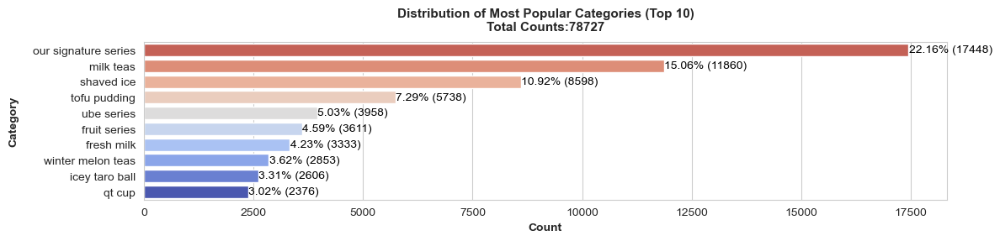

In [106]:
cat_count = df_dish.groupby('Category')['Count'].sum().sort_values(ascending=False)
data = cat_count[:10]
data_percentages = get_percentage(cat_count)[:10]

plt.figure(figsize=(12,5))
plt.subplot(2, 1, 1)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Category", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Most Popular Categories (Top 10)\nTotal Counts:{sum(cat_count)}",fontsize=11, fontweight="bold", pad=10)


plt.tight_layout()
plt.show()

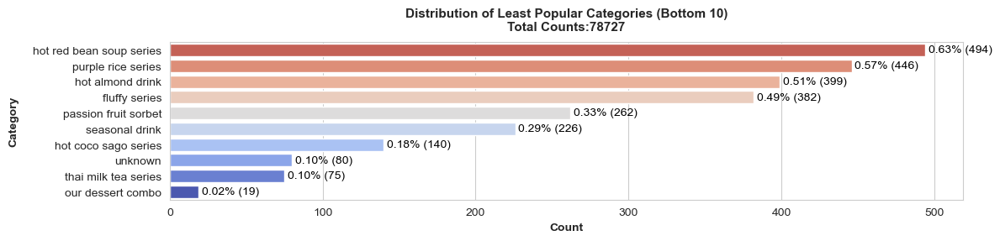

In [108]:
cat_count = df_dish.groupby('Category')['Count'].sum().sort_values(ascending=False)
data = cat_count[-10:]
data_percentages = get_percentage(cat_count)[-10:]

plt.figure(figsize=(12,5))
plt.subplot(2, 1, 1)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 2, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Category", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Least Popular Categories (Bottom 10)\nTotal Counts:{sum(cat_count)}",fontsize=11, fontweight="bold", pad=10)


plt.tight_layout()
plt.show()

## 1.3 Product Popularity By Month

### 1.3.1 Most Popular Products

In [10]:
#df_dish['YearMonth'] = df_dish['Date'].dt.to_period('M')
monthly_counts = df_dish.groupby(['YearMonth', 'Dishes & Customizations Breakdown'])['Count'].sum().reset_index()

total_sales['YearMonth'] = total_sales['Date'].dt.to_period('M')
total_counts = total_sales.groupby('YearMonth')['Count'].sum().reset_index()

In [11]:
most_popular = monthly_counts.loc[monthly_counts.groupby('YearMonth')['Count'].idxmax()].reset_index(drop=True)
most_popular['% Total Counts'] = round(most_popular[['Count']]/total_counts[['Count']]*100,2)
most_popular

,YearMonth,Dishes & Customizations Breakdown,Count,% Total Counts
0,2023-01,icy grass jelly signature,237,10.99
1,2023-02,icy grass jelly signature,172,10.02
2,2023-03,icy grass jelly signature,292,12.06
3,2023-04,icy grass jelly signature,242,10.70
4,2023-05,icy grass jelly signature,341,12.72
5,2023-06,icy grass jelly signature,380,13.13
6,2023-07,icy grass jelly signature,443,12.89
7,2023-08,icy grass jelly signature,464,12.36
8,2023-09,icy grass jelly signature,324,10.89
9,2023-10,icy grass jelly signature,242,10.51


In [12]:
top_5_dishes = monthly_counts.groupby('YearMonth').apply(lambda x: x.nlargest(5, 'Count')).reset_index(drop=True)

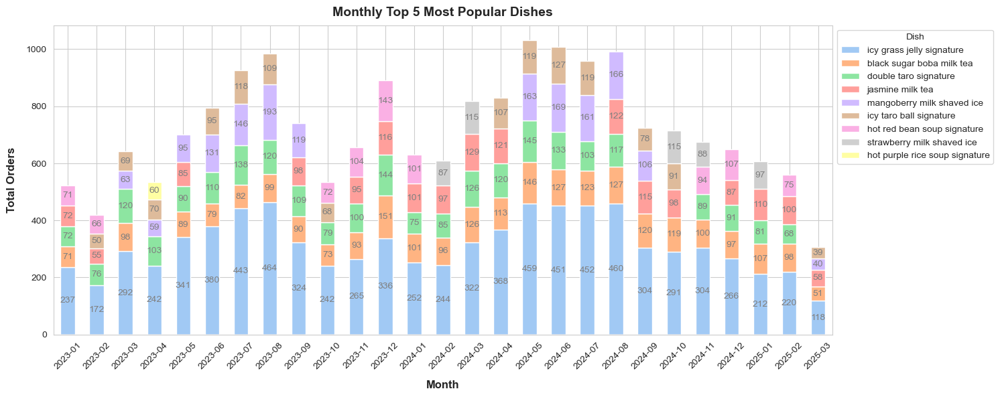

In [13]:
# Pivot the data for stacked bar chart
pivot_df = top_5_dishes.pivot(index="YearMonth", columns="Dishes & Customizations Breakdown", values="Count").fillna(0)

# Step 1: Calculate total counts for each dish
total_counts = pivot_df.sum().sort_values(ascending=False)  # Sort by total count

# Step 2: Reorder pivot_df columns based on sorted order
pivot_df = pivot_df[total_counts.index]

# Step 3: Define custom colors (after reordering to match the sorted dishes)
custom_colors = sns.color_palette("pastel", n_colors=len(pivot_df.columns))

# Step 4: Create stacked bar chart
ax = pivot_df.plot(kind='bar', stacked=True, figsize=(15, 6), color=custom_colors)

# Step 5: Annotate labels
for bars in ax.containers:  
    for bar in bars:  
        height = bar.get_height()
        if height > 0:  # Only label non-zero bars
            ax.text(
                bar.get_x() + bar.get_width() / 2,  
                bar.get_y() + height / 2,  
                int(height),  
                ha='center', va='center', fontsize=10, color='grey' #fontweight='bold'
            )

# Step 6: Customize the legend to reflect the sorted order
handles, labels = ax.get_legend_handles_labels()
sorted_handles_labels = sorted(zip(handles, labels), key=lambda x: total_counts[x[1]], reverse=True)
sorted_handles, sorted_labels = zip(*sorted_handles_labels)

ax.legend(sorted_handles, sorted_labels, title="Dish", bbox_to_anchor=(1, 1))

# Final plot adjustments
plt.title("Monthly Top 5 Most Popular Dishes", fontsize=14, pad=10, fontweight='bold')
plt.xlabel("Month", fontsize=12, labelpad=10, fontweight='bold')
plt.ylabel("Total Orders", fontsize=12, labelpad=10, fontweight='bold')
plt.xticks(rotation=45)
plt.show()

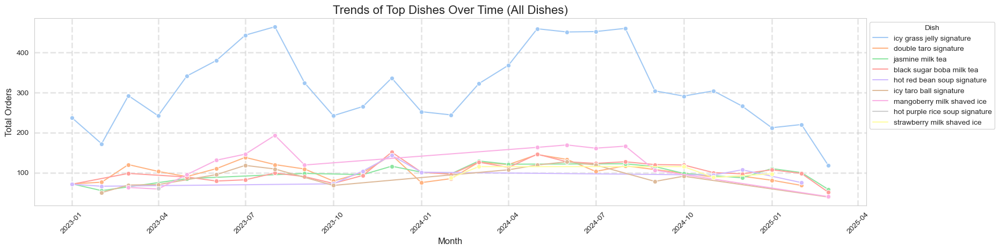

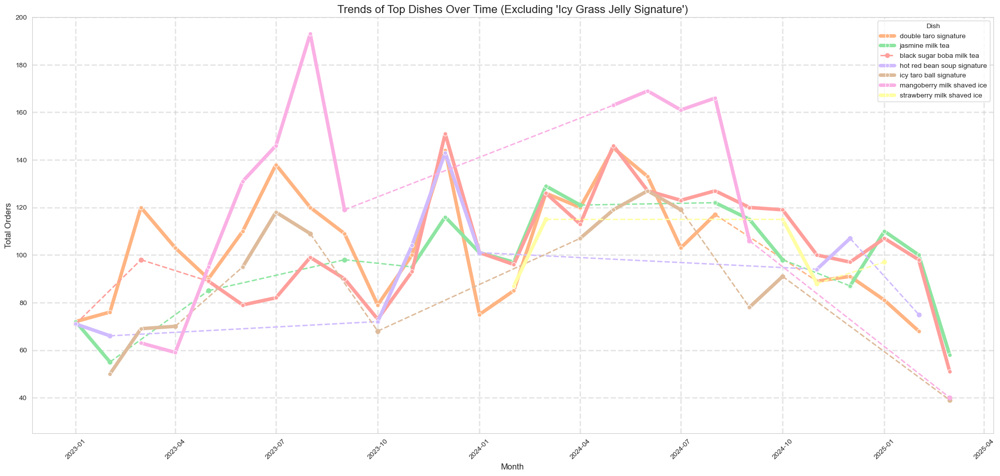

In [14]:
# Ensure YearMonth is in datetime format (convert Period to Timestamp)
top_5_dishes = monthly_counts.groupby('YearMonth').apply(lambda x: x.nlargest(5, 'Count')).reset_index(drop=True)
top_5_dishes["YearMonth"] = pd.to_datetime(top_5_dishes["YearMonth"].astype(str), format="%Y-%m")

unique_dishes = top_5_dishes['Dishes & Customizations Breakdown'].unique()
palette = sns.color_palette("pastel", n_colors=len(unique_dishes))

# Set figure size for 1st plot
plt.figure(figsize=(20, 10))

# First plot (original graph with all dishes)
plt.subplot(2, 1, 1)  # Top subplot
# Plot each dish including "icy grass jelly signature"
sns.lineplot(
    data=top_5_dishes,
    x="YearMonth", 
    y="Count",
    hue="Dishes & Customizations Breakdown",  # Different lines for each dish
    marker="o", 
    palette="pastel"
)

# Customize the first plot
plt.title("Trends of Top Dishes Over Time (All Dishes)", fontsize=16)
plt.xlabel("Month", fontsize=12)
plt.ylabel("Total Orders", fontsize=12)
plt.xticks(rotation=45)
plt.legend(title="Dish", bbox_to_anchor=(1, 1))
plt.grid(True, linestyle="--", linewidth=2, alpha=0.5)

# Set figure size for 2nd plot
plt.figure(figsize=(20, 18))

# Second plot (without 'icy grass jelly signature')
plt.subplot(2, 1, 2)  # Bottom subplot
# Plot each dish excluding "icy grass jelly signature"
for i, dish in enumerate(unique_dishes):
    if dish != "icy grass jelly signature":  # Exclude this dish
        dish_data = top_5_dishes[top_5_dishes["Dishes & Customizations Breakdown"] == dish]
        
        # To check for gaps between months, we can first sort the data by YearMonth
        dish_data = dish_data.sort_values(by="YearMonth")

        # Variable to track if the dish is already labeled
        first_segment = True
        
        # Loop through and check if consecutive months exist for connecting with a solid line or dashed line for gaps
        for j in range(1, len(dish_data)):
            # Check if consecutive months differ by more than one month
            if (dish_data["YearMonth"].iloc[j] - dish_data["YearMonth"].iloc[j-1]).days > 31:
                # If there's a gap, plot a dashed line between them
                plt.plot(
                    [dish_data["YearMonth"].iloc[j-1], dish_data["YearMonth"].iloc[j]],
                    [dish_data["Count"].iloc[j-1], dish_data["Count"].iloc[j]],
                    linestyle="--",
                    color=palette[i],
                    label=dish if first_segment else "",  # Label only the first segment
                    marker="o",
                    linewidth=2
                )
                first_segment = False
            
            else:
                # If consecutive, plot a solid line
                sns.lineplot(
                    data=dish_data.iloc[j-1:j+1],  # Just plot two consecutive points
                    x="YearMonth", 
                    y="Count",
                    label=dish if first_segment else "",  # Only label once for the dish
                    marker="o",
                    color=palette[i],  
                    linewidth=5
                )
                first_segment = False # After the first segment, stop labeling

# Customize the second plot
plt.title("Trends of Top Dishes Over Time (Excluding 'Icy Grass Jelly Signature')", fontsize=16)
plt.xlabel("Month", fontsize=12)
plt.ylabel("Total Orders", fontsize=12)
plt.xticks(rotation=45)

# Adjust y-axis limit to provide more space between lines
plt.ylim(25, 200)

# Add grid, legend, and layout adjustments
plt.legend(title="Dish", bbox_to_anchor=(1, 1))
plt.grid(True, linestyle="--", linewidth=2, alpha=0.5)

# Show the plots
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

### 1.3.2 Least Popular Products

In [15]:
unique_dish = df_dish['Dishes & Customizations Breakdown'].unique()

least_popular = {}
all_unpopular = []
for year_month in df_dish['YearMonth'].unique():
    dish_sold = df_dish[df_dish['YearMonth']==year_month]['Dishes & Customizations Breakdown'].unique()
    least_popular[year_month] = set(unique_dish)-set(dish_sold)
    all_unpopular += least_popular[year_month]

all_unpopular = Counter(all_unpopular)

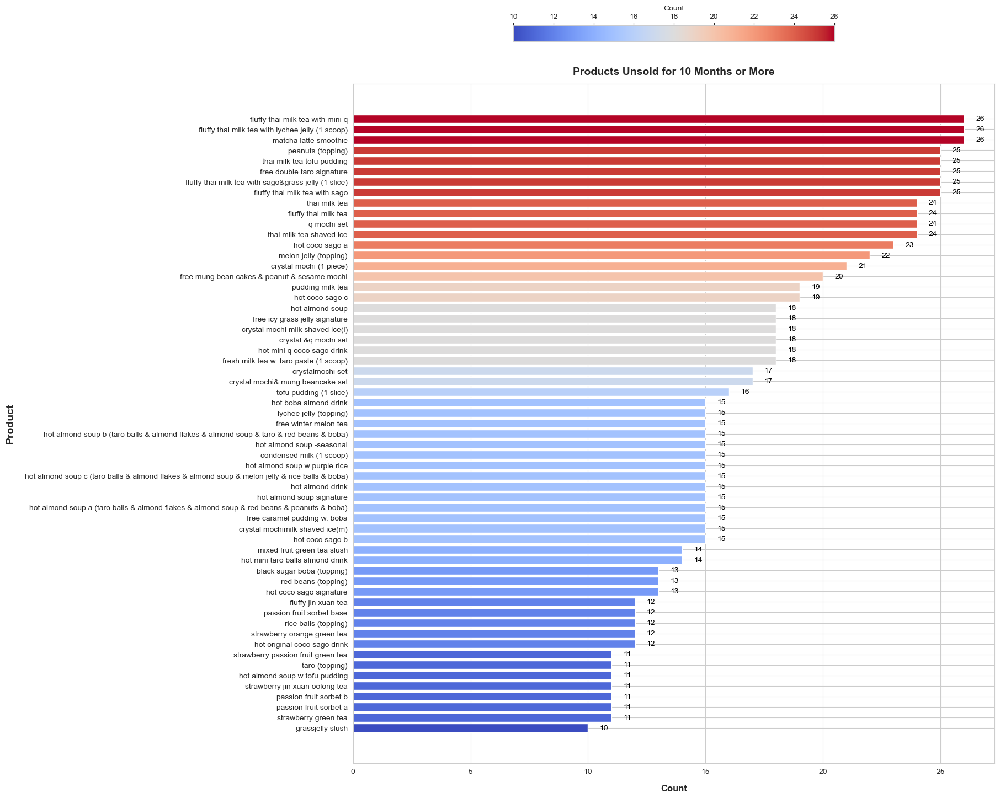

In [16]:
# Filter items with count > 9
filtered_data = {k: v for k, v in all_unpopular.items() if v > 9}

# Convert to DataFrame for easier plotting
df = pd.DataFrame(filtered_data.items(), columns=['Product', 'Count'])

# Sort by count in descending order
df = df.sort_values(by='Count', ascending=False)

# Normalize count values for colormap
norm = plt.Normalize(df['Count'].min(), df['Count'].max())
colors = cm.coolwarm(norm(df['Count']))

# Create the figure and axis
fig, ax = plt.subplots(figsize=(15, 20))

# Plot the bar chart
bars = ax.barh(df['Product'], df['Count'], color=colors)
ax.set_xlabel('Count', fontsize=12, fontweight='bold', labelpad=12)
ax.set_ylabel('Product', fontsize=14, fontweight='bold', labelpad=12)
ax.set_title('Products Unsold for 10 Months or More', fontsize=14, fontweight='bold', pad=12)
ax.invert_yaxis()  # Show highest count on top

# Add count annotations
for bar in bars:
    width = bar.get_width()  # Get the width (count) of the bar
    ax.text(width + 0.5, bar.get_y() + bar.get_height() / 2,  # Position text next to the bar
            f'{width}', va='center', fontsize=10, color='black')

# Add color bar
sm = cm.ScalarMappable(norm=norm, cmap="coolwarm")
sm.set_array([])  # Needed for colorbar to work properly
cbar = plt.colorbar(sm, ax=ax, shrink=0.5, location='top')
cbar.set_label("Count")


# Show plot
plt.show()

### 1.3.3 Customization Item Popularity

#### 1) All Items Together

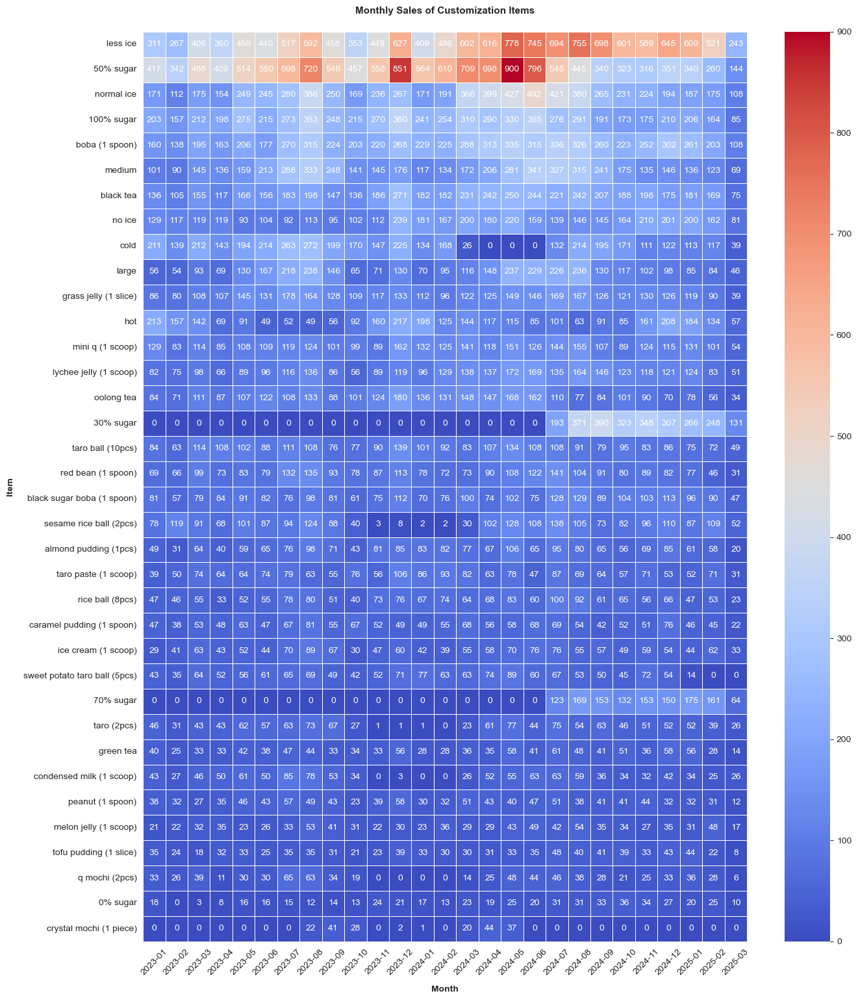

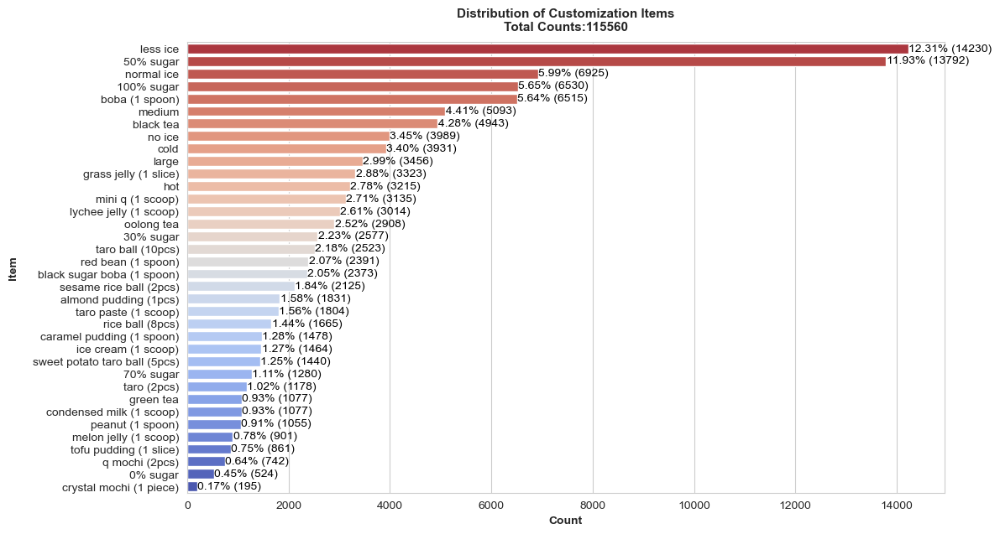

In [20]:
monthly_cust_count = df_cust.groupby(['YearMonth','Dishes & Customizations Breakdown'])['Count'].sum()
cust_count = df_cust.groupby('Dishes & Customizations Breakdown')['Count'].sum().sort_values(ascending=False)

data = pd.DataFrame(monthly_cust_count).reset_index().sort_values(by=['Dishes & Customizations Breakdown','YearMonth'])
data_pivot = data.pivot(index="Dishes & Customizations Breakdown", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[cust_count.index,:]

plt.figure(figsize=(15, 40))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Customization Items", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Item", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = cust_count
data_percentages = get_percentage(data)

plt.figure(figsize=(12,12))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Item", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Customization Items\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

#### 2) Sugar Level

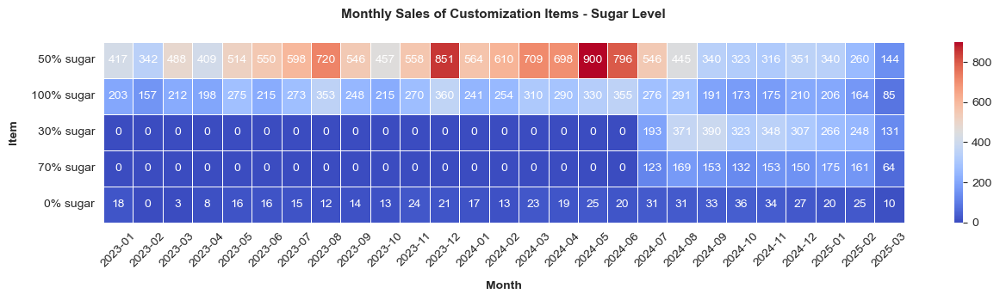

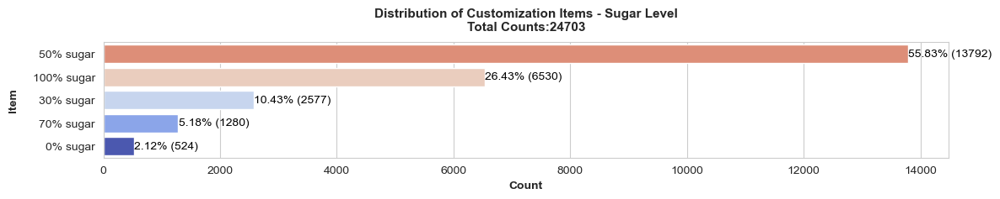

In [21]:
sugar_level = ['0% sugar','30% sugar','50% sugar','70% sugar','100% sugar']
monthly_cust_count = df_cust[df_cust['Dishes & Customizations Breakdown'].isin(sugar_level)].groupby(['YearMonth','Dishes & Customizations Breakdown'])['Count'].sum()
cust_count = df_cust[df_cust['Dishes & Customizations Breakdown'].isin(sugar_level)].groupby('Dishes & Customizations Breakdown')['Count'].sum().sort_values(ascending=False)

data = pd.DataFrame(monthly_cust_count).reset_index().sort_values(by=['Dishes & Customizations Breakdown','YearMonth'])
data_pivot = data.pivot(index="Dishes & Customizations Breakdown", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[cust_count.index,:]

plt.figure(figsize=(15, 6))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Customization Items - Sugar Level", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Item", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = cust_count
data_percentages = get_percentage(data)

plt.figure(figsize=(12,4))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Item", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Customization Items - Sugar Level\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

#### 3) Dessert/Drink Temperature

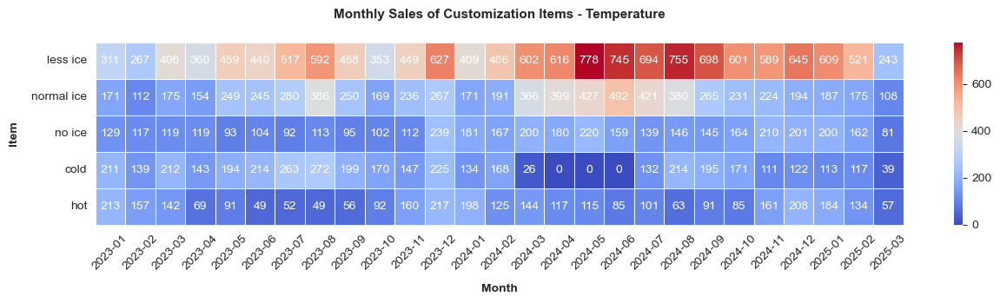

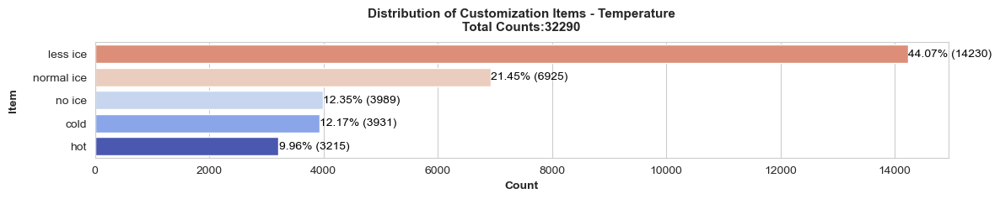

In [22]:
temp_level = ['normal ice','less ice','no ice','hot','cold']
monthly_cust_count = df_cust[df_cust['Dishes & Customizations Breakdown'].isin(temp_level)].groupby(['YearMonth','Dishes & Customizations Breakdown'])['Count'].sum()
cust_count = df_cust[df_cust['Dishes & Customizations Breakdown'].isin(temp_level)].groupby('Dishes & Customizations Breakdown')['Count'].sum().sort_values(ascending=False)

data = pd.DataFrame(monthly_cust_count).reset_index().sort_values(by=['Dishes & Customizations Breakdown','YearMonth'])
data_pivot = data.pivot(index="Dishes & Customizations Breakdown", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[cust_count.index,:]

plt.figure(figsize=(15, 6))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Customization Items - Temperature", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Item", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = cust_count
data_percentages = get_percentage(data)

plt.figure(figsize=(12,4))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Item", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Customization Items - Temperature\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

注意：这里的cold&hot没有包含温度已经固定的dish，比如icy grass jelly。

#### 4) Size

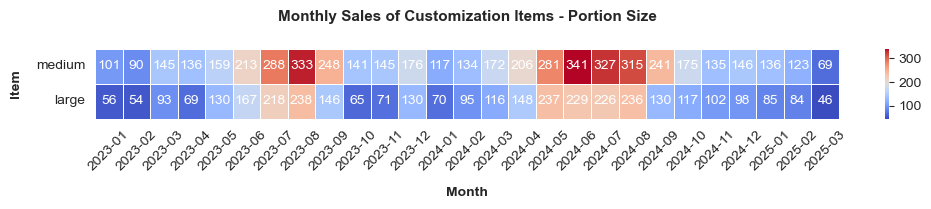

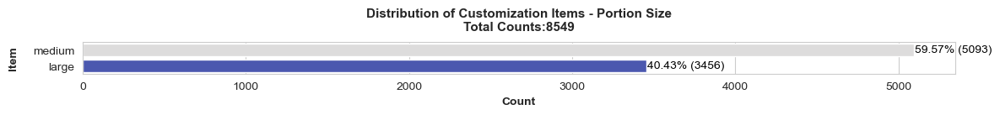

In [23]:
size = ['medium','large']
monthly_cust_count = df_cust[df_cust['Dishes & Customizations Breakdown'].isin(size)].groupby(['YearMonth','Dishes & Customizations Breakdown'])['Count'].sum()
cust_count = df_cust[df_cust['Dishes & Customizations Breakdown'].isin(size)].groupby('Dishes & Customizations Breakdown')['Count'].sum().sort_values(ascending=False)

data = pd.DataFrame(monthly_cust_count).reset_index().sort_values(by=['Dishes & Customizations Breakdown','YearMonth'])
data_pivot = data.pivot(index="Dishes & Customizations Breakdown", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[cust_count.index,:]

plt.figure(figsize=(12, 2))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Customization Items - Portion Size", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Item", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = cust_count
data_percentages = get_percentage(data)

plt.figure(figsize=(12,2))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Item", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Customization Items - Portion Size\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

注意：这里的size数量没有包含已经带size的产品，比如xxx（l）。

#### 5) Add-ons

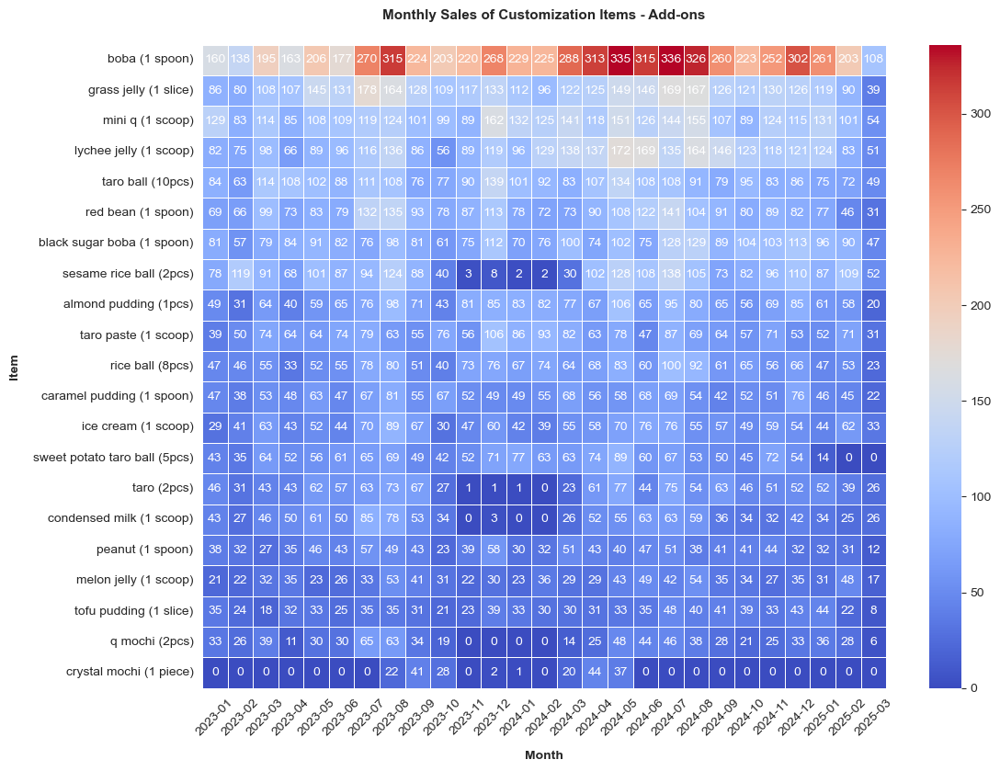

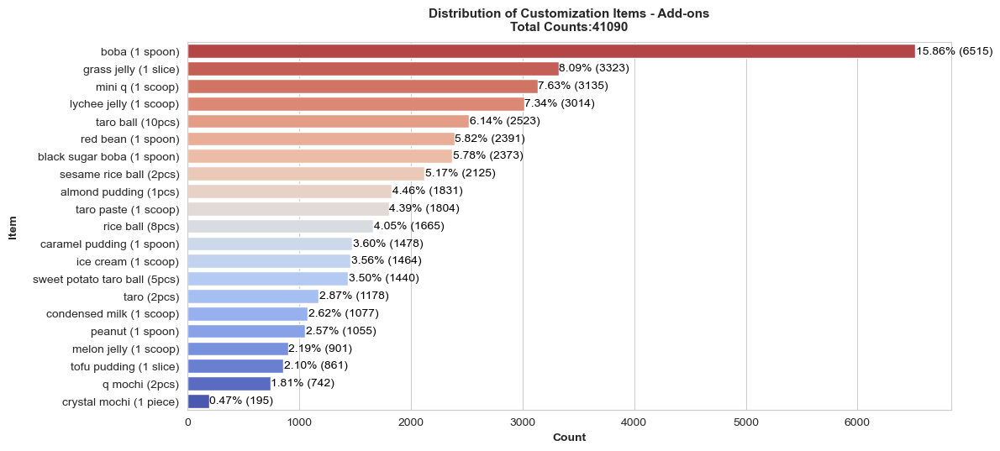

In [26]:
add_ons = ['taro paste (1 scoop)', 'ice cream (1 scoop)', 'mini q (1 scoop)',
       'taro ball (10pcs)', 'boba (1 spoon)', 'sweet potato taro ball (5pcs)',
       'black sugar boba (1 spoon)', 'almond pudding (1pcs)','tofu pudding (1 slice)', 'grass jelly (1 slice)',
       'red bean (1 spoon)', 'lychee jelly (1 scoop)','melon jelly (1 scoop)', 'rice ball (8pcs)',
       'caramel pudding (1 spoon)', 'sesame rice ball (2pcs)','peanut (1 spoon)', 'taro (2pcs)',
       'crystal mochi (1 piece)', 'condensed milk (1 scoop)','q mochi (2pcs)']
monthly_cust_count = df_cust[df_cust['Dishes & Customizations Breakdown'].isin(add_ons)].groupby(['YearMonth','Dishes & Customizations Breakdown'])['Count'].sum()
cust_count = df_cust[df_cust['Dishes & Customizations Breakdown'].isin(add_ons)].groupby('Dishes & Customizations Breakdown')['Count'].sum().sort_values(ascending=False)

data = pd.DataFrame(monthly_cust_count).reset_index().sort_values(by=['Dishes & Customizations Breakdown','YearMonth'])
data_pivot = data.pivot(index="Dishes & Customizations Breakdown", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[cust_count.index,:]

plt.figure(figsize=(12, 20))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Customization Items - Add-ons", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Item", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = cust_count
data_percentages = get_percentage(data)

plt.figure(figsize=(12,10))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Item", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Customization Items - Add-ons\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

#### 6) Check Customization Item Count by Product

使用以下function来查看某个产品的associated customization items。

In [206]:
def check_associated_customization(keyword):

    ## Keyword：输入具体的产品名称，例如‘icy grass jelly signature’
    
    monthly_count = df_cust[df_cust['Associated Dish'].str.contains(keyword)].groupby(['YearMonth','Dishes & Customizations Breakdown'])['Count'].sum()
    count = df_cust[df_cust['Associated Dish'].str.contains(keyword)].groupby(['Dishes & Customizations Breakdown'])['Count'].sum().sort_values(ascending=False)
    
    data = pd.DataFrame(monthly_count).reset_index().sort_values(by=['YearMonth','Dishes & Customizations Breakdown'])
    data_pivot = data.pivot(index='Dishes & Customizations Breakdown', columns="YearMonth", values="Count").fillna(0)
    data_pivot = data_pivot.loc[count.index,:]

    plt.figure(figsize=(15, 18))
    plt.subplot(2, 1, 1)
    ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)
    
    # Manually annotate each cell
    for i in range(data_pivot.shape[0]):  # Rows
        for j in range(data_pivot.shape[1]):  # Columns
            value = data_pivot.iloc[i, j]
            ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                    ha="center", va="center", color="white", fontsize=10)
    
    # Add title and labels
    plt.title(f"Monthly Sales of Customization Items\nfor {keyword.title()}", fontsize=11, fontweight="bold", pad=20)
    plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
    plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
    plt.xticks(rotation=45)
    
    plt.show()
    
    data = count
    data_percentages = get_percentage(data)
    
    plt.figure(figsize=(12,7))
    plt.subplot(2, 1, 2)
    # Get pastel color palette
    #colors = sns.color_palette("coolwarm", len(labels))
    
    cmap = plt.get_cmap("coolwarm")
    colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
    # Create bar chart
    ax = sns.barplot(x=data.values, y=data.index, palette=colors)
    # Add percentage labels
    for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
        if size >= 100:
            ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')
        else: ax.text(size + 1, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')
    
    
    # Add labels and title
    plt.xlabel("Count", fontweight="bold")
    plt.ylabel("Product", fontweight="bold", labelpad=12)
    plt.title(f"Distribution of Customization Items\nfor {keyword.title()}\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)
    
    plt.tight_layout()
    plt.show()

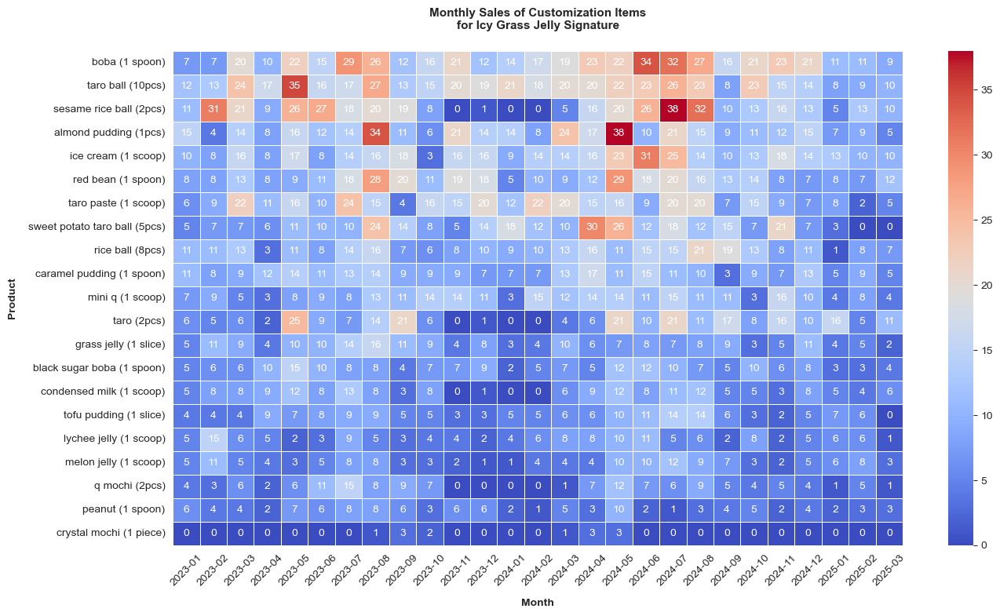

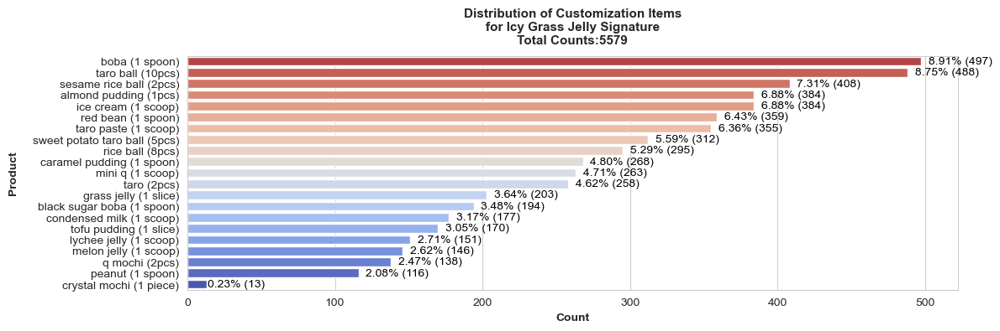

In [207]:
check_associated_customization('icy grass jelly signature')

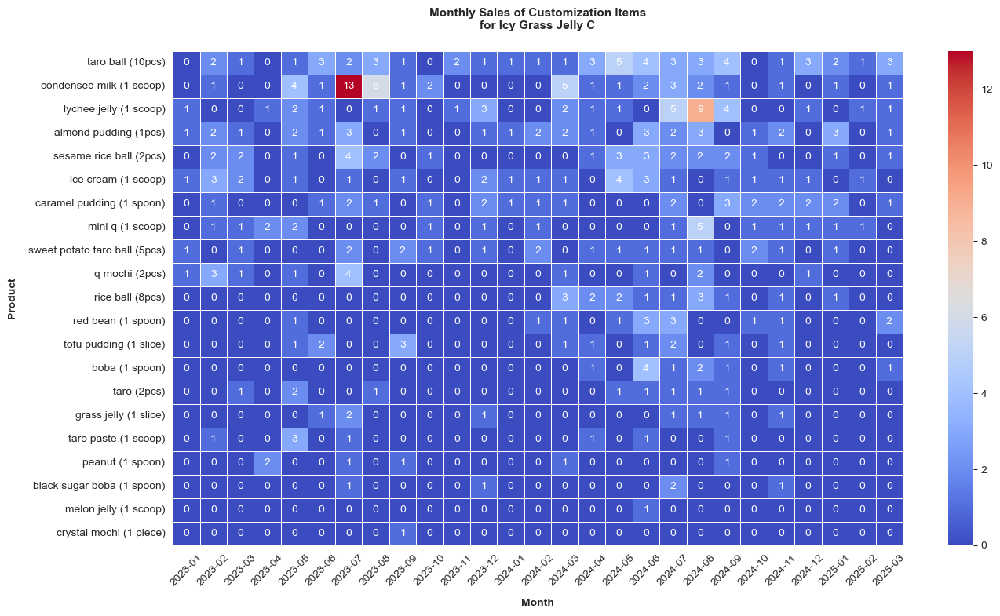

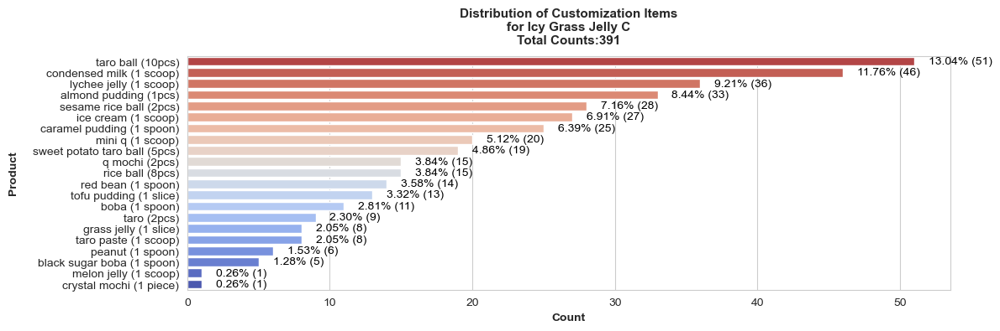

In [208]:
check_associated_customization('icy grass jelly c')

# 2. Dessert Series Analysis

## 2.1 Signature Products

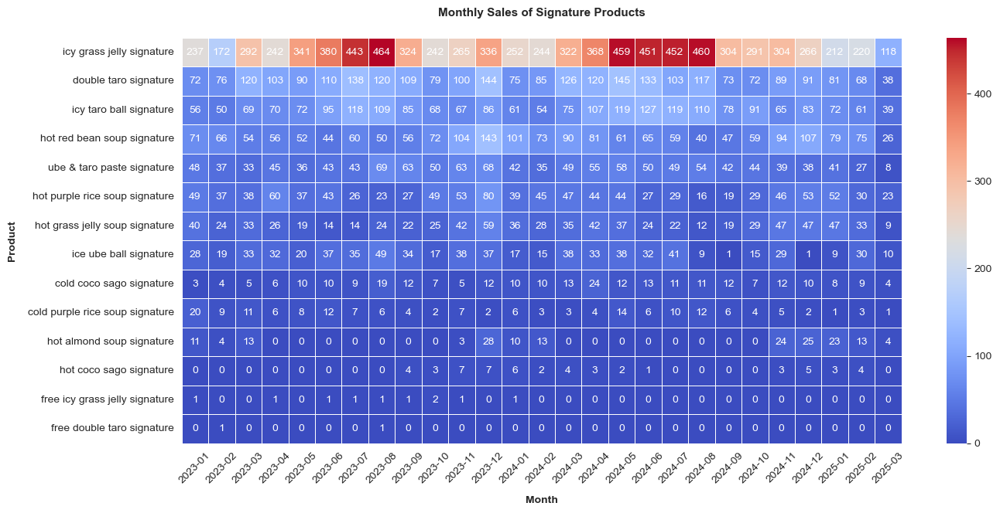

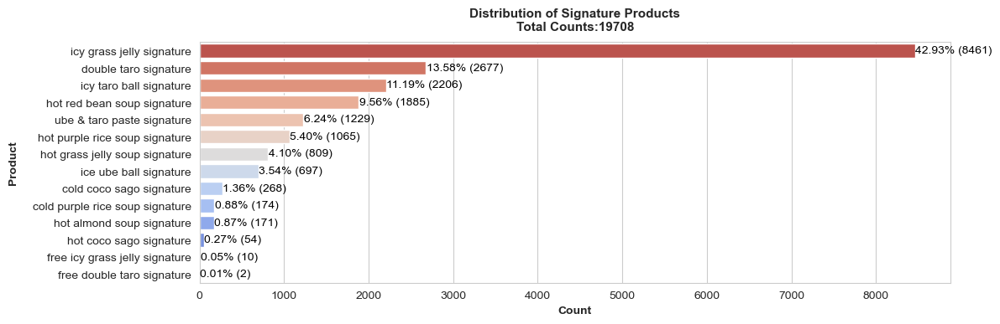

In [34]:
monthly_sig_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains('signature')].groupby(['YearMonth','Associated Dish'])['Count'].sum()
sig_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains('signature')].groupby('Associated Dish')['Count'].sum().sort_values(ascending=False)


data = pd.DataFrame(monthly_sig_count).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[sig_count.index,:]

plt.figure(figsize=(15, 15))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Signature Products", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = sig_count
data_percentages = get_percentage(data)

plt.figure(figsize=(12,7))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Signature Products\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

*<b>-----销量观察-----<b>*

<b>（1）主力商品：Icy Grass Jelly Signature
* 稳定热销：全年销量最高，且没有明显淡季，说明它是一个“招牌产品”或者“流量担当”。
* 夏季优势明显：5月-9月销量最高，单月销量甚至可以超过400份，符合冷饮在夏季更受欢迎的趋势。

<b>（2）次热销产品：Double Taro Signature & Icy Taro Ball Signature
* 季节性明显：春夏销量较好（100份以上），秋冬销量下降。
* 相比之下Double Taro Signature更稳定，而Icy Taro Ball Signature季节性相对更强。

<b>（3）秋冬畅销品：Hot Red Bean Soup Signature
* 10月-次年1月销量高峰，且该段时间销量整体优于Double Taro Signature和Icy Taro Ball Signature，说明它是“冬季流量产品”。

<b>（4）表现不佳产品：Cold/Hot Coco Sago Signature & Cold Purple Rice Soup Signature
* Coco Sago Signature：无论冷热，销量都低迷，Hot版本更惨，月销量经常是0或个位数，最高也不会超过10份。
* Cold Purple Rice Soup Signature：销量不理想，50%以上时间月销量低于10份，相对于Hot版本来说，Cold版本市场接受度较低。

<b>（5）季节性供应：Hot Almond Soup Signature
* 夏季停售，冬季销量一般，最高不超过30份，产品本身受欢迎程度有限。

*<b>-----营销建议-----<b>*
<li>Icy Grass Jelly Signature可以作为夏季主推产品，并结合套餐搭配带动其他销量一般或不理想的产品，提高整体销售额。
<li>在春夏期间主推Double Taro Signature & Icy Taro Ball Signature，营销主题可以是“芋头主题季”；可以在秋冬加大推广Hot Red Bean Soup Signature作为“暖身甜品”。
<li>表现不佳的产品可以尝试与热销品进行组合销售提升销量，比如cold coco sago signature（单价9.75）和icy grass jelly signature（单价8.75）捆绑售卖为17.5。

## 2.2 Grass Jelly-related Products

### 2.2.1 Dishes
* Include 'icy grass jelly series', 'hot grass jelly soup series', and other products that contain grass jelly.

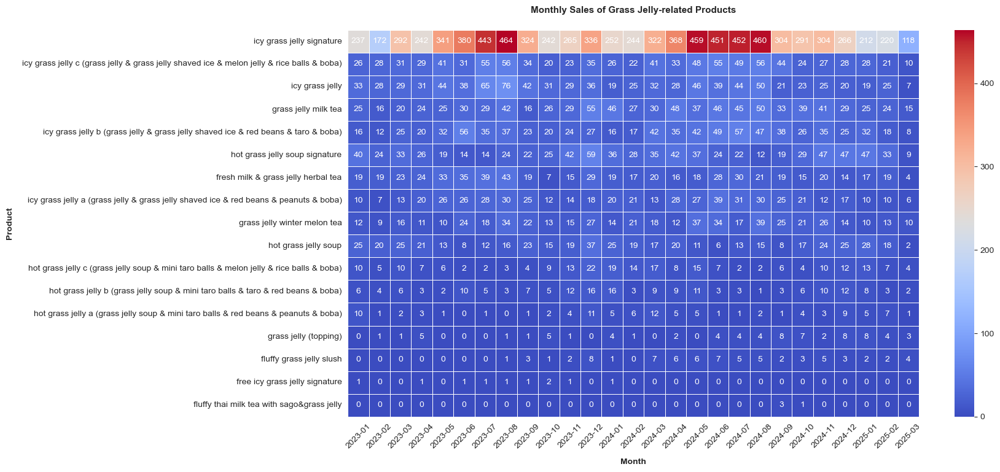

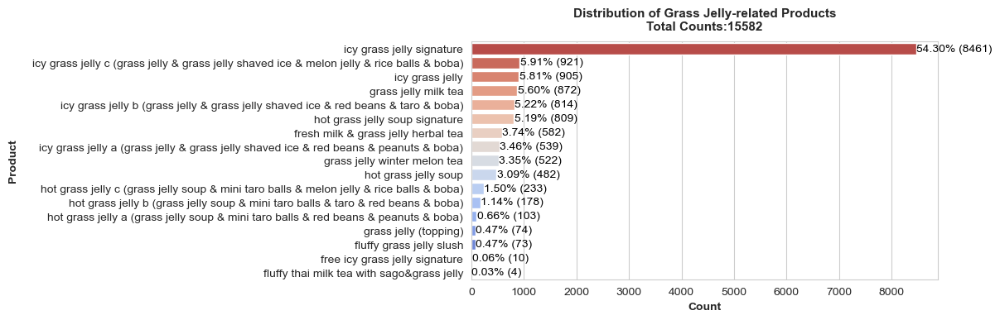

In [118]:
monthly_gj_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains('grass jelly')].groupby(['YearMonth','Associated Dish'])['Count'].sum()
gj_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains('grass jelly')].groupby('Associated Dish')['Count'].sum().sort_values(ascending=False)


data = pd.DataFrame(monthly_gj_count).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[gj_count.index,:]

plt.figure(figsize=(15, 18))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Grass Jelly-related Products", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = gj_count
data_percentages = get_percentage(data)

plt.figure(figsize=(12,7))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Grass Jelly-related Products\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

### 2.2.2 Customizations
* grass jelly作为customization item出现，与其他产品进行搭配。

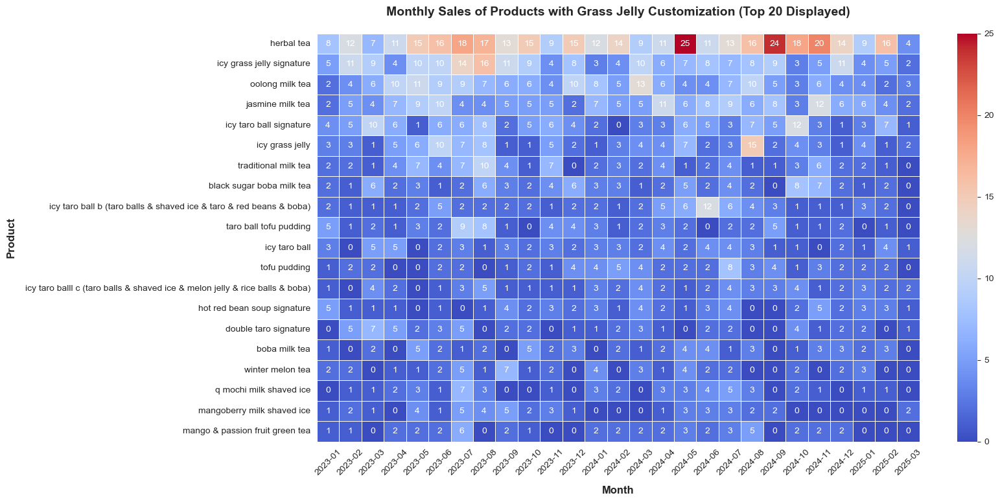

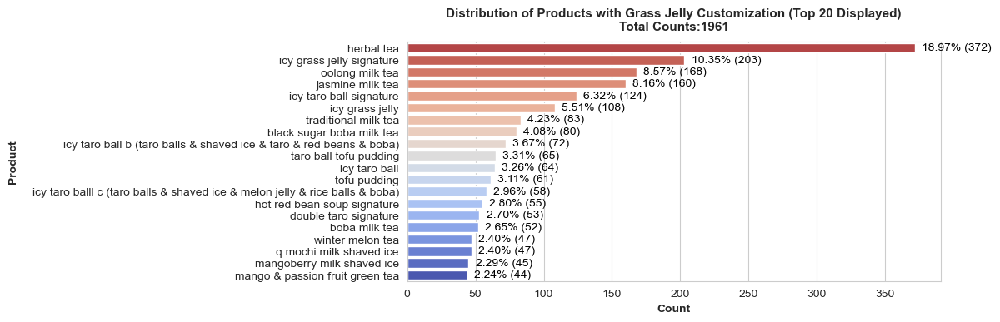

In [205]:
monthly_grass_count = df_cust[df_cust['Dishes & Customizations Breakdown'].str.contains('grass jelly')].groupby(['YearMonth','Associated Dish'])['Count'].sum()
grass_count = df_cust[df_cust['Dishes & Customizations Breakdown'].str.contains('grass jelly')].groupby('Associated Dish')['Count'].sum().sort_values(ascending=False)


data = pd.DataFrame(monthly_grass_count).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[grass_count.index,:]
data_pivot = data_pivot.iloc[:20,:] # Get only Top 20

plt.figure(figsize=(15, 18))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Products with Grass Jelly Customization (Top 20 Displayed)", fontsize=14, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=12, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=12, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = grass_count[:20]
data_percentages = get_percentage(data)

plt.figure(figsize=(12,7))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Products with Grass Jelly Customization (Top 20 Displayed)\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

## 2.3 Shaved Ice-related Products
* 包含shaved ice系列本身以及其他配料中含有shaved ice的甜品，例如icy taro ball b，icy grass jelly c，等等。

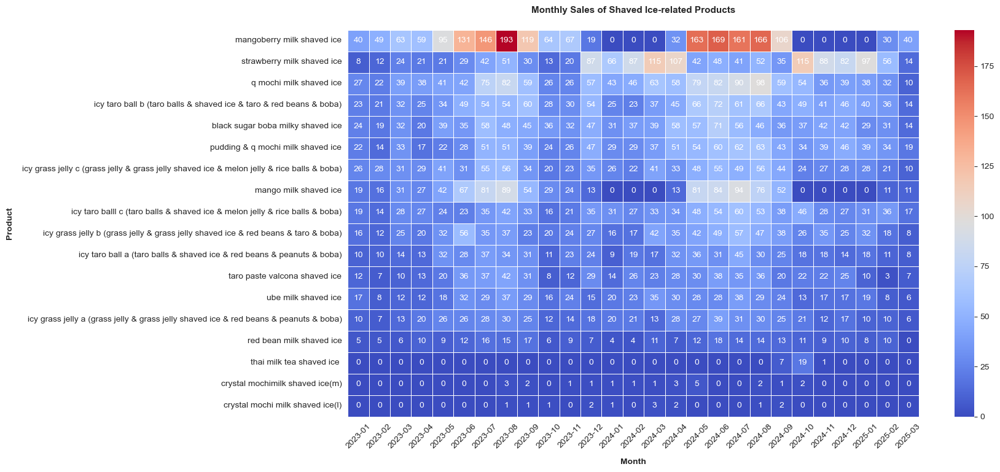

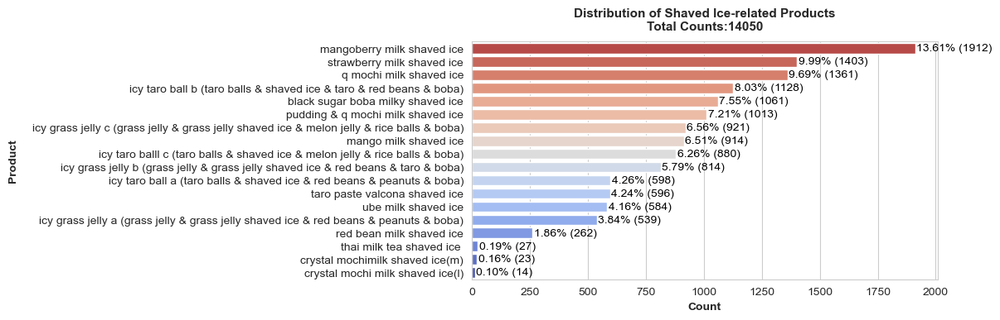

In [150]:
monthly_si_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains('shaved ice')].groupby(['YearMonth','Associated Dish'])['Count'].sum()
si_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains('shaved ice')].groupby('Associated Dish')['Count'].sum().sort_values(ascending=False)


data = pd.DataFrame(monthly_si_count).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[si_count.index,:]

plt.figure(figsize=(15, 18))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Shaved Ice-related Products", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = si_count
data_percentages = get_percentage(data)

plt.figure(figsize=(12,7))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Shaved Ice-related Products\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

## 2.4 Slush Series
* 包含官方菜单划分为slush series的产品。

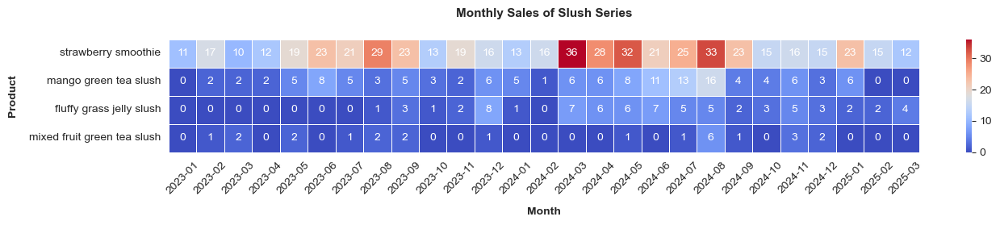

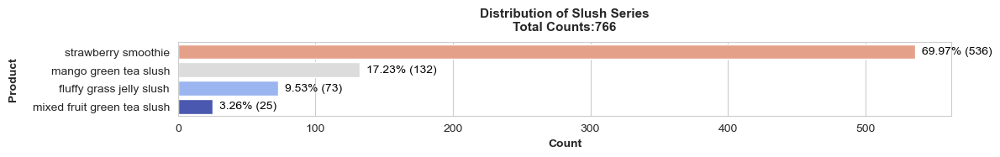

In [157]:
slush = 'strawberry smoothie|mango green tea slush|mixed fruit green tea slush|fluffy grass jelly slush'

monthly_slush_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains(slush)].groupby(['YearMonth','Associated Dish'])['Count'].sum()
slush_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains(slush)].groupby('Associated Dish')['Count'].sum().sort_values(ascending=False)


data = pd.DataFrame(monthly_slush_count).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[slush_count.index,:]

plt.figure(figsize=(15, 4))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Slush Series", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = slush_count
data_percentages = get_percentage(data)

plt.figure(figsize=(12,3))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Slush Series\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

## 2.5 Icy Taro Ball Products

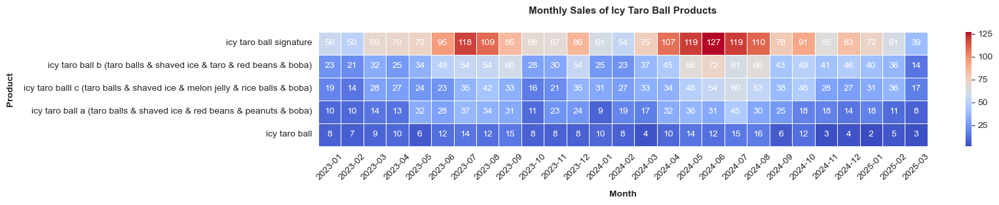

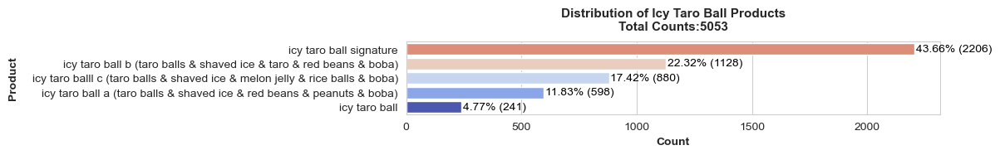

In [166]:
monthly_itb_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains('icy taro ball')].groupby(['YearMonth','Associated Dish'])['Count'].sum()
itb_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains('icy taro ball')].groupby('Associated Dish')['Count'].sum().sort_values(ascending=False)


data = pd.DataFrame(monthly_itb_count).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[itb_count.index,:]

plt.figure(figsize=(15, 5))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Icy Taro Ball Products", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = itb_count
data_percentages = get_percentage(data)

plt.figure(figsize=(12,3))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Icy Taro Ball Products\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

## 2.6 Red Bean-related Products

### 2.6.1 Dishes
* 包含'hot red bean soup series'以及其他配料中含有red beans的甜品，例如icy grass jelly a，hot almond soup b，等等。

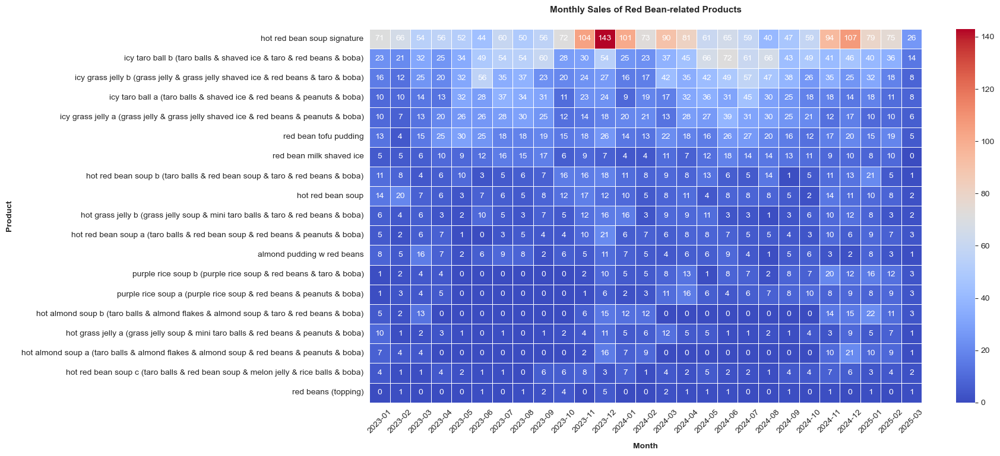

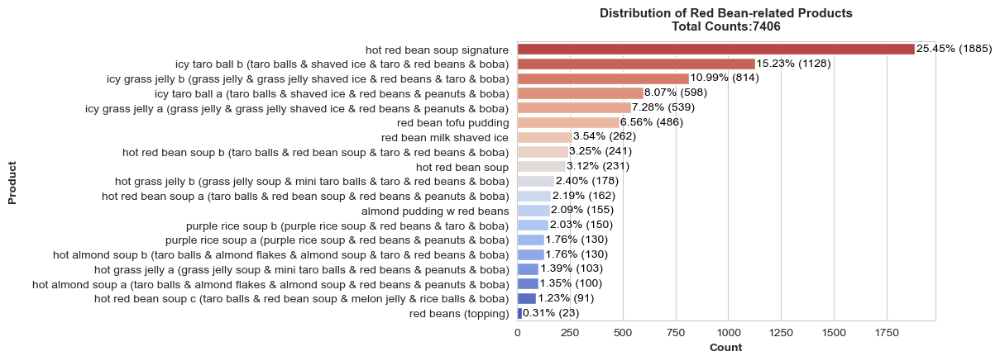

In [170]:
monthly_rb_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains('red bean')].groupby(['YearMonth','Associated Dish'])['Count'].sum()
rb_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains('red bean')].groupby('Associated Dish')['Count'].sum().sort_values(ascending=False)


data = pd.DataFrame(monthly_rb_count).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[rb_count.index,:]

plt.figure(figsize=(15, 18))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Red Bean-related Products", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = rb_count
data_percentages = get_percentage(data)

plt.figure(figsize=(12,8))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Red Bean-related Products\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

### 2.6.2 Customizations
* red beans作为customization item出现，与其他产品进行搭配。

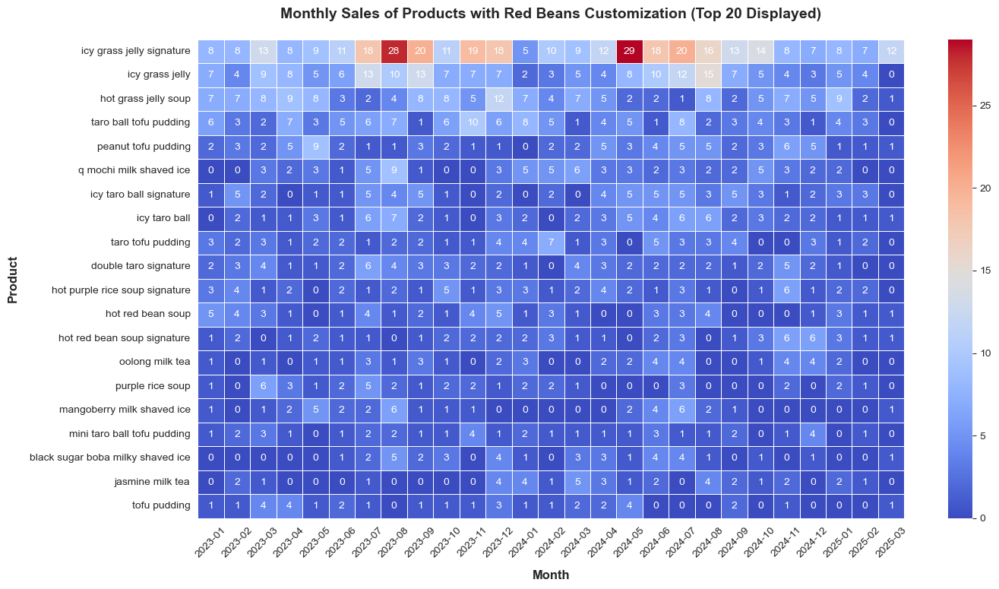

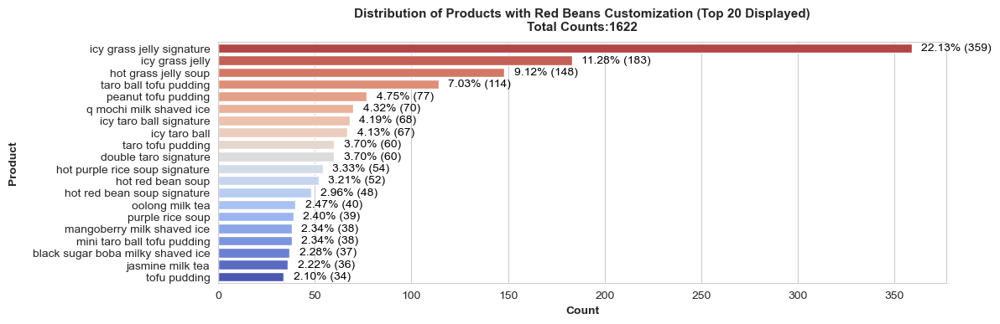

In [171]:
monthly_rb_count = df_cust[df_cust['Dishes & Customizations Breakdown'].str.contains('red bean')].groupby(['YearMonth','Associated Dish'])['Count'].sum()
rb_count = df_cust[df_cust['Dishes & Customizations Breakdown'].str.contains('red bean')].groupby('Associated Dish')['Count'].sum().sort_values(ascending=False)


data = pd.DataFrame(monthly_rb_count).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[rb_count.index,:]
data_pivot = data_pivot.iloc[:20,:] # Get only Top 20

plt.figure(figsize=(15, 18))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Products with Red Beans Customization (Top 20 Displayed)", fontsize=14, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=12, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=12, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = rb_count[:20]
data_percentages = get_percentage(data)

plt.figure(figsize=(12,7))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Products with Red Beans Customization (Top 20 Displayed)\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

## 2.7 Tofu Pudding-Related Products

### 2.7.1 Dishes

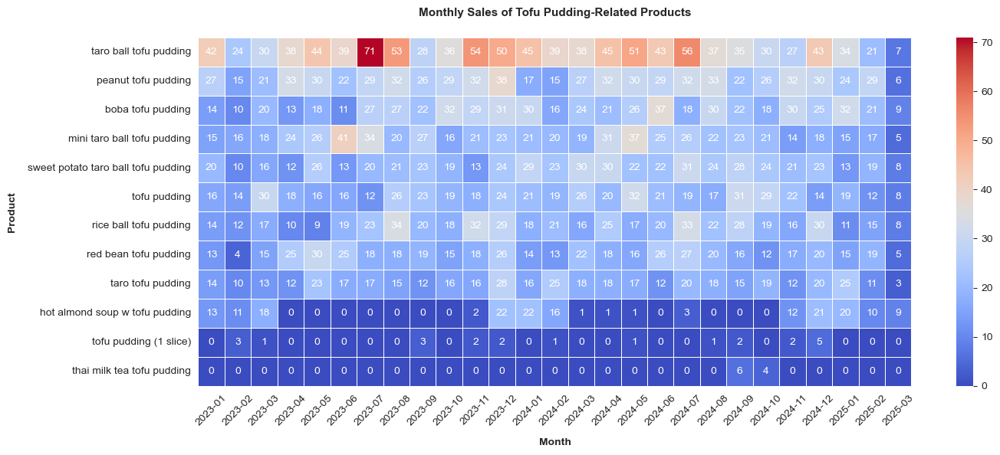

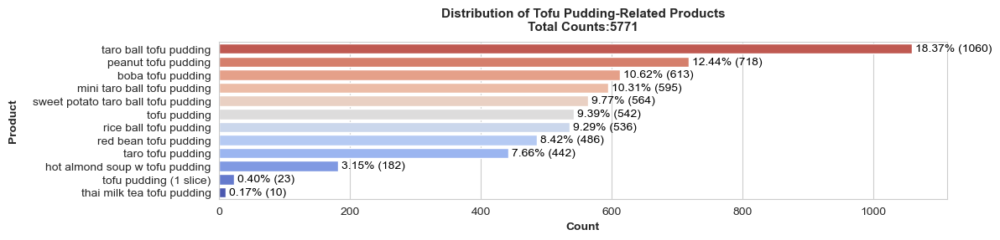

In [27]:
monthly_tofu_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains('tofu pudding')].groupby(['YearMonth','Associated Dish'])['Count'].sum()
tofu_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains('tofu pudding')].groupby('Associated Dish')['Count'].sum().sort_values(ascending=False)


data = pd.DataFrame(monthly_tofu_count).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[tofu_count.index,:]

plt.figure(figsize=(15, 13))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Tofu Pudding-Related Products", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = tofu_count
data_percentages = get_percentage(data)

plt.figure(figsize=(12,5))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Tofu Pudding-Related Products\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

### 2.7.2 Customizations
* tofu pudding作为customization item出现，与其他产品进行搭配。

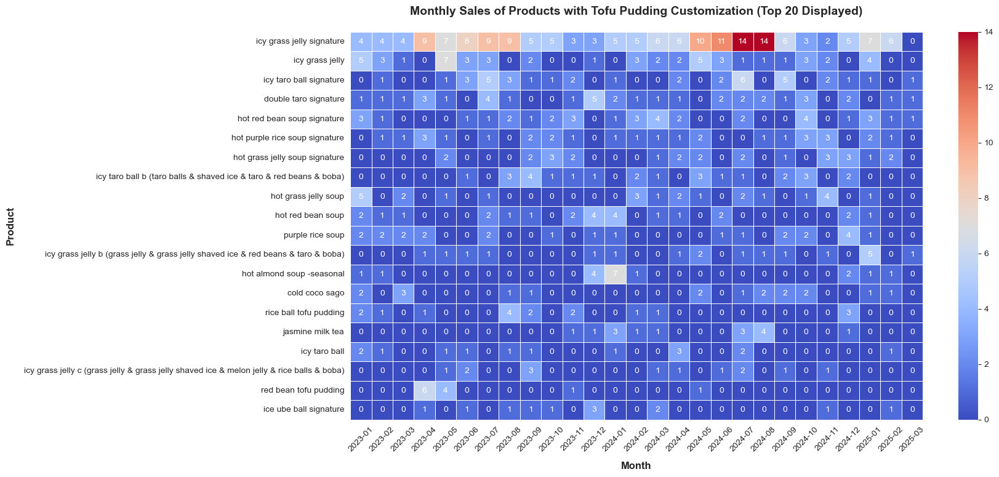

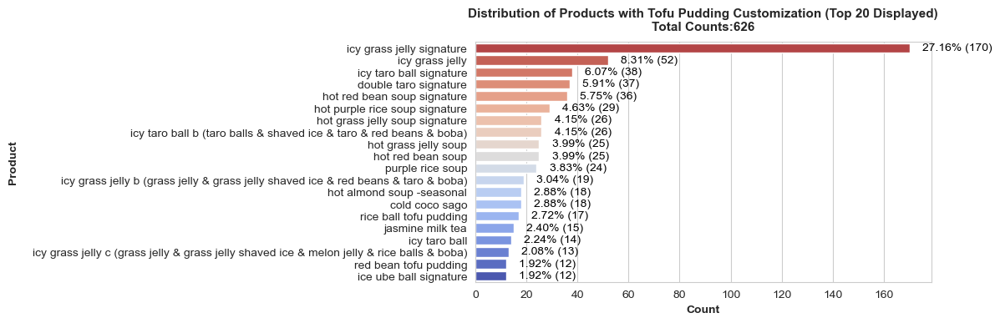

In [28]:
monthly_tofu_count = df_cust[df_cust['Dishes & Customizations Breakdown'].str.contains('tofu pudding')].groupby(['YearMonth','Associated Dish'])['Count'].sum()
tofu_count = df_cust[df_cust['Dishes & Customizations Breakdown'].str.contains('tofu pudding')].groupby('Associated Dish')['Count'].sum().sort_values(ascending=False)


data = pd.DataFrame(monthly_tofu_count).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[tofu_count.index,:]
data_pivot = data_pivot.iloc[:20,:] # Get only Top 20

plt.figure(figsize=(15, 18))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Products with Tofu Pudding Customization (Top 20 Displayed)", fontsize=14, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=12, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=12, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = tofu_count[:20]
data_percentages = get_percentage(data)

plt.figure(figsize=(12,7))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Products with Tofu Pudding Customization (Top 20 Displayed)\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

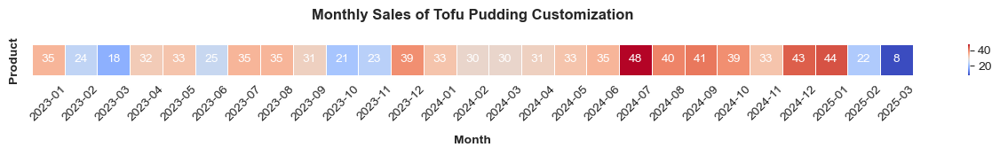

In [29]:
monthly_tofu_count = df_cust[df_cust['Dishes & Customizations Breakdown'].str.contains('tofu pudding')].groupby(['YearMonth','Dishes & Customizations Breakdown'])['Count'].sum()
tofu_count = df_cust[df_cust['Dishes & Customizations Breakdown'].str.contains('tofu pudding')].groupby('Dishes & Customizations Breakdown')['Count'].sum().sort_values(ascending=False)

data = pd.DataFrame(monthly_tofu_count).reset_index().sort_values(by=['Dishes & Customizations Breakdown','YearMonth'])
data_pivot = data.pivot(index="Dishes & Customizations Breakdown", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[tofu_count.index,:]

plt.figure(figsize=(16, 1))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Tofu Pudding Customization", fontsize=12, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)
ax.set_yticks([])

plt.show()

In [30]:
tofu_count

Dishes & Customizations Breakdown
tofu pudding (1 slice)    861
Name: Count, dtype: int64

## 2.8 Passion Fruit Sorbet

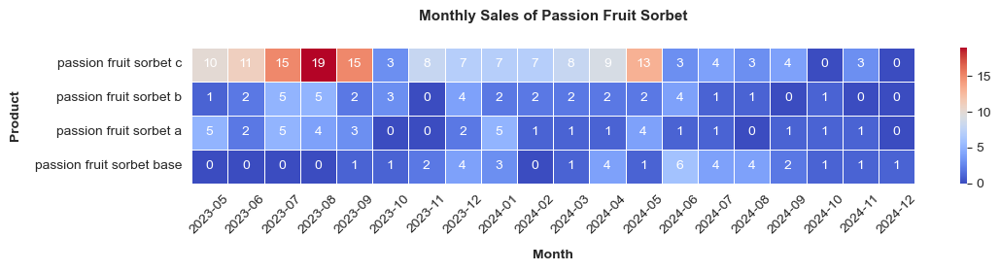

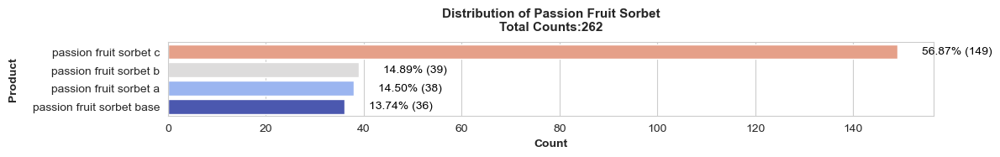

In [190]:
keyword = 'passion fruit sorbet'
monthly_pfs_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains(keyword)].groupby(['YearMonth','Associated Dish'])['Count'].sum()
pfs_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains(keyword)].groupby('Associated Dish')['Count'].sum().sort_values(ascending=False)


data = pd.DataFrame(monthly_pfs_count).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[pfs_count.index,:]

plt.figure(figsize=(12, 4))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title(f"Monthly Sales of {keyword.title()}", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = pfs_count
data_percentages = get_percentage(data)

plt.figure(figsize=(12,3))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of {keyword.title()}\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

## 2.9 QT Cups

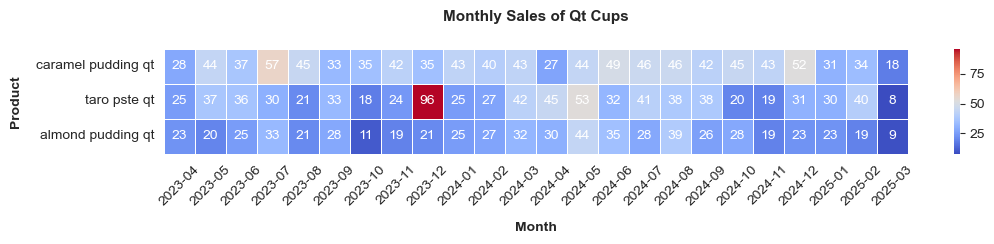

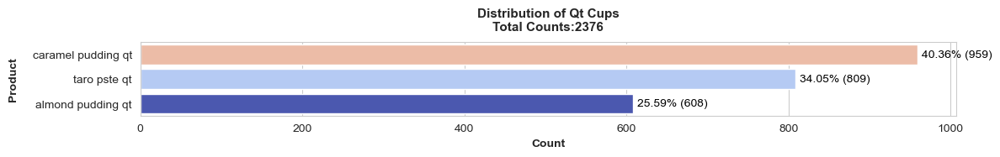

In [196]:
keyword = 'qt'
monthly_qt_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains(keyword)].groupby(['YearMonth','Associated Dish'])['Count'].sum()
qt_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains(keyword)].groupby('Associated Dish')['Count'].sum().sort_values(ascending=False)


data = pd.DataFrame(monthly_qt_count).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[qt_count.index,:]

plt.figure(figsize=(12, 3))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title(f"Monthly Sales of {keyword.title()} Cups", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = qt_count
data_percentages = get_percentage(data)

plt.figure(figsize=(12,3))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of {keyword.title()} Cups\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

## 2.10 Small Bites

/var/folders/2j/gh2xdkp1765byk_0xxc2qbrc0000gn/T/ipykernel_72892/3655985078.py:2: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  monthly_sm_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains(keyword,regex=True)].groupby(['YearMonth','Associated Dish'])['Count'].sum()
/var/folders/2j/gh2xdkp1765byk_0xxc2qbrc0000gn/T/ipykernel_72892/3655985078.py:3: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  sm_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains(keyword,regex=True)].groupby('Associated Dish')['Count'].sum().sort_values(ascending=False)


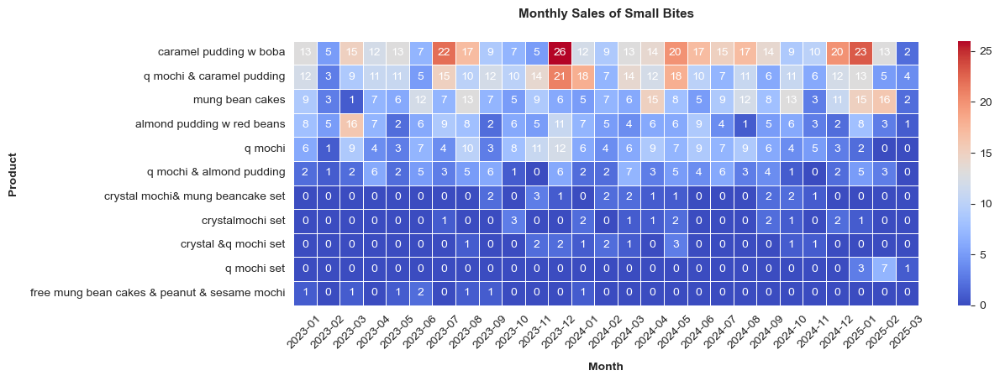

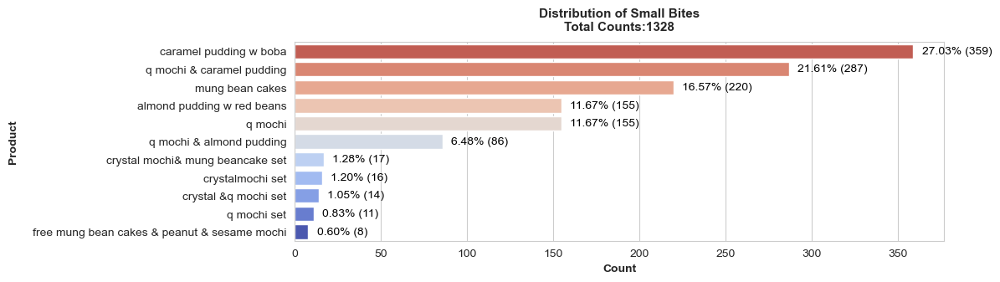

In [204]:
keyword = 'q mochi & (caramel|almond) pudding|^q mochi$|almond pudding w red beans|caramel pudding w boba|crystalmochi set|crystal &q mochi set|mung bean cakes|crystal mochi& mung beancake set|q mochi set'
monthly_sm_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains(keyword,regex=True)].groupby(['YearMonth','Associated Dish'])['Count'].sum()
sm_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains(keyword,regex=True)].groupby('Associated Dish')['Count'].sum().sort_values(ascending=False)


data = pd.DataFrame(monthly_sm_count).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[sm_count.index,:]

plt.figure(figsize=(12, 9))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Small Bites", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = sm_count
data_percentages = get_percentage(data)

plt.figure(figsize=(12,6))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Small Bites\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

# 3. Hybrid Series Analysis

*Note: Hybrid series include both desserts and drinks.

## 3.1 Ube-related Products

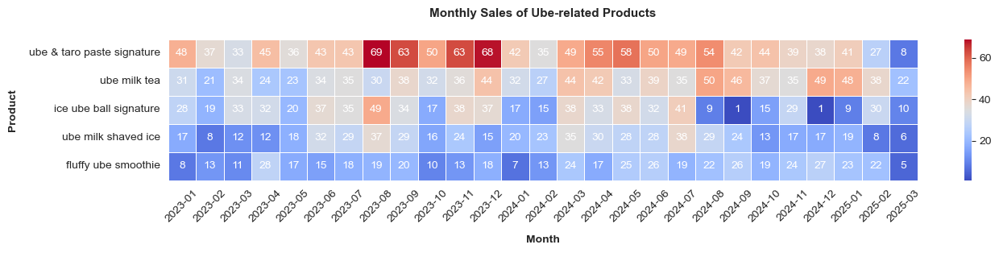

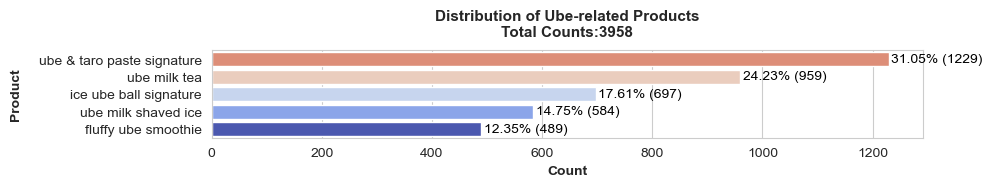

In [185]:
keyword = 'ube'

data = pd.DataFrame(search_monthly_count(keyword)).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[search_count(keyword).index,:]

plt.figure(figsize=(15, 5))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Ube-related Products", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = search_count(keyword)
data_percentages = get_percentage(data)

plt.figure(figsize=(10,3))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Ube-related Products\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

## 3.2 Purple Rice-related Products

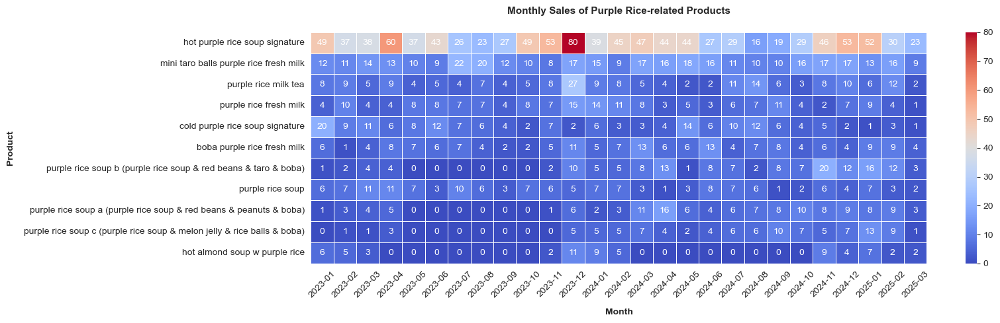

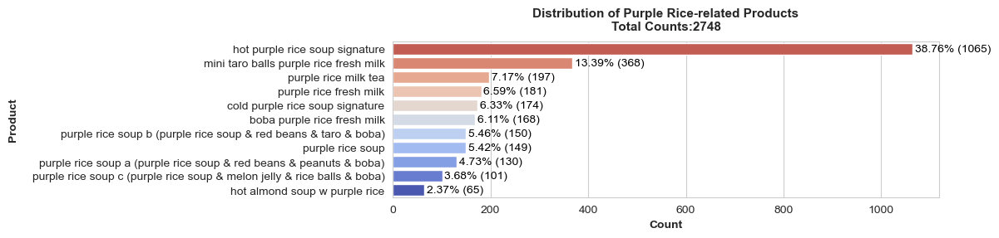

In [183]:
keyword = 'purple rice'

data = pd.DataFrame(search_monthly_count(keyword)).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[search_count(keyword).index,:]

plt.figure(figsize=(15, 10))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Purple Rice-related Products", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = search_count(keyword)
data_percentages = get_percentage(data)

plt.figure(figsize=(12,5))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Purple Rice-related Products\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

## 3.3 Almond-related Products

### 3.3.1 Dishes

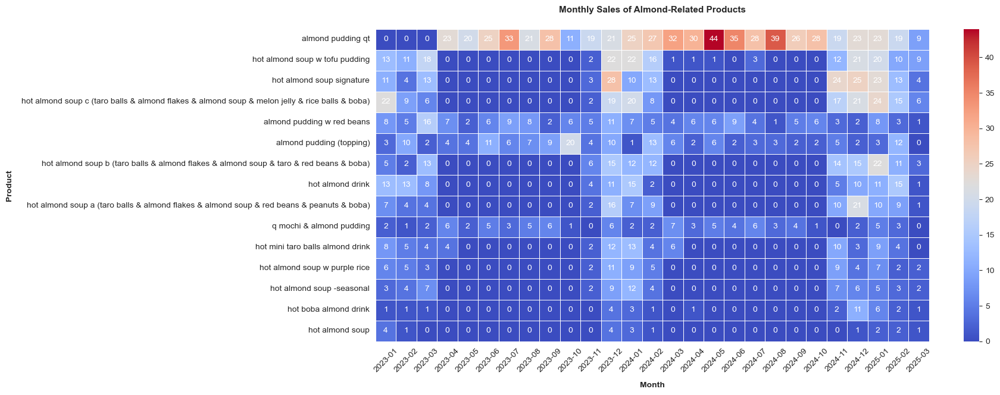

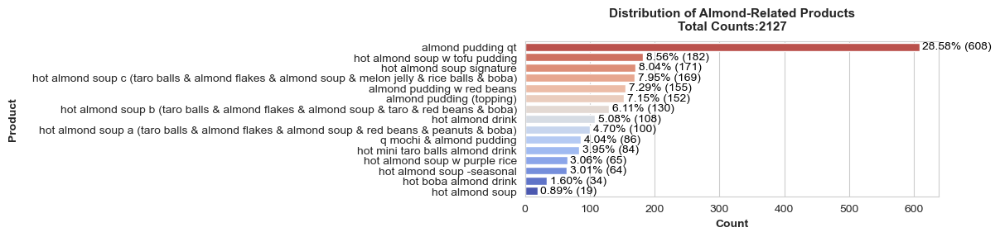

In [251]:
monthly_almond_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains('almond')].groupby(['YearMonth','Associated Dish'])['Count'].sum()
almond_count = df_dish[df_dish['Dishes & Customizations Breakdown'].str.contains('almond')].groupby('Associated Dish')['Count'].sum().sort_values(ascending=False)


data = pd.DataFrame(monthly_almond_count).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[almond_count.index,:]

plt.figure(figsize=(15, 15))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Almond-Related Products", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = almond_count
data_percentages = get_percentage(data)

plt.figure(figsize=(12,5))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Almond-Related Products\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

### 3.3.2 Customizations
* almond pudding作为customization item出现，与其他产品进行搭配。

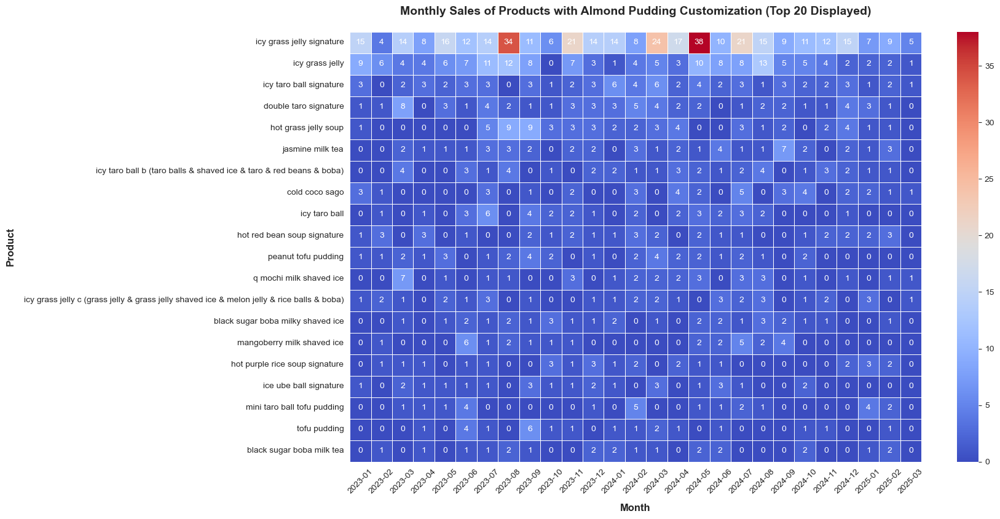

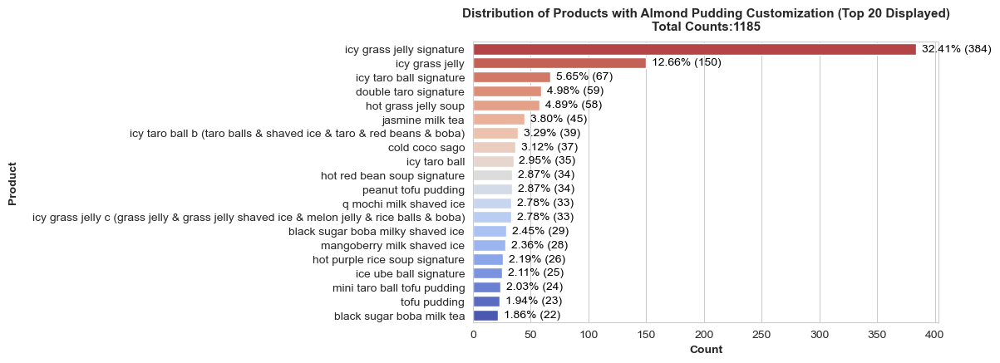

In [238]:
monthly_almond_count = df_cust[df_cust['Dishes & Customizations Breakdown'].str.contains('almond')].groupby(['YearMonth','Associated Dish'])['Count'].sum()
almond_count = df_cust[df_cust['Dishes & Customizations Breakdown'].str.contains('almond')].groupby('Associated Dish')['Count'].sum().sort_values(ascending=False)


data = pd.DataFrame(monthly_almond_count).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[almond_count.index,:]
data_pivot = data_pivot.iloc[:20,:] # Get only Top 20

plt.figure(figsize=(15, 20))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Products with Almond Pudding Customization (Top 20 Displayed)", fontsize=14, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=12, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=12, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = almond_count[:20]
data_percentages = get_percentage(data)

plt.figure(figsize=(12,8))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Products with Almond Pudding Customization (Top 20 Displayed)\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

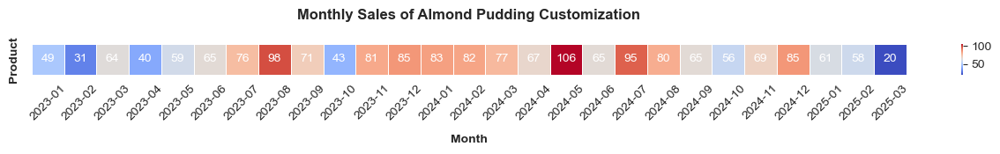

In [272]:
monthly_almond_count = df_cust[df_cust['Dishes & Customizations Breakdown'].str.contains('almond')].groupby(['YearMonth','Dishes & Customizations Breakdown'])['Count'].sum()
almond_count = df_cust[df_cust['Dishes & Customizations Breakdown'].str.contains('almond')].groupby('Dishes & Customizations Breakdown')['Count'].sum().sort_values(ascending=False)

data = pd.DataFrame(monthly_almond_count).reset_index().sort_values(by=['Dishes & Customizations Breakdown','YearMonth'])
data_pivot = data.pivot(index="Dishes & Customizations Breakdown", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[almond_count.index,:]

plt.figure(figsize=(16, 1))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Almond Pudding Customization", fontsize=12, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)
ax.set_yticks([])

plt.show()

## 3.4 Coco Sago-related Products

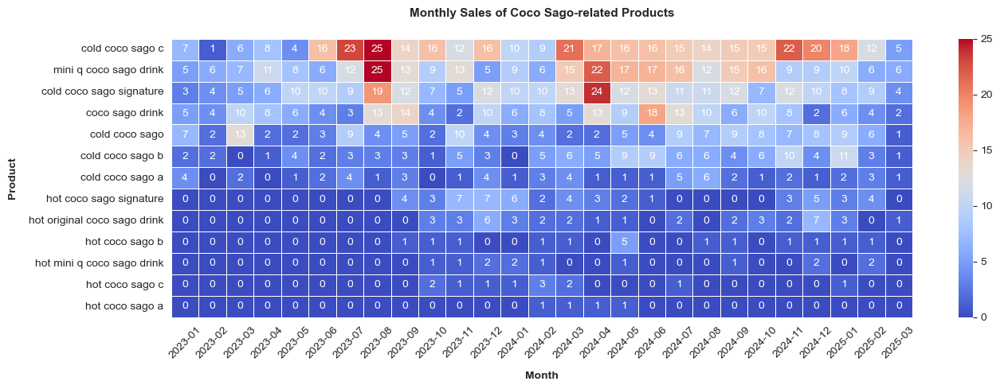

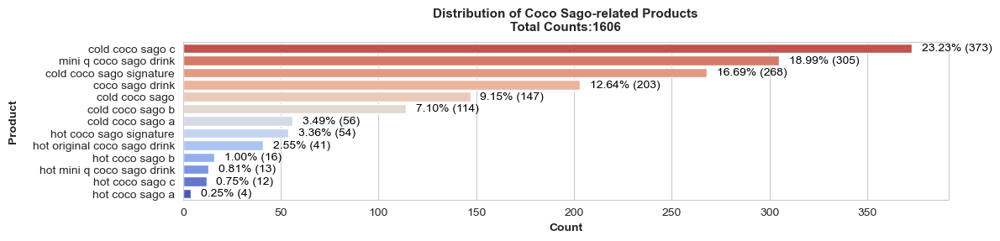

In [184]:
keyword = 'coco sago'

data = pd.DataFrame(search_monthly_count(keyword)).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[search_count(keyword).index,:]

plt.figure(figsize=(15, 10))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Coco Sago-related Products", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = search_count(keyword)
data_percentages = get_percentage(data)

plt.figure(figsize=(12,5))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Coco Sago-related Products\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

## 3.5 Thai Milk Tea-related Products

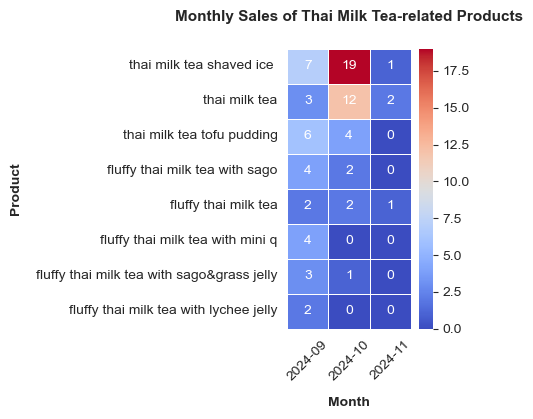

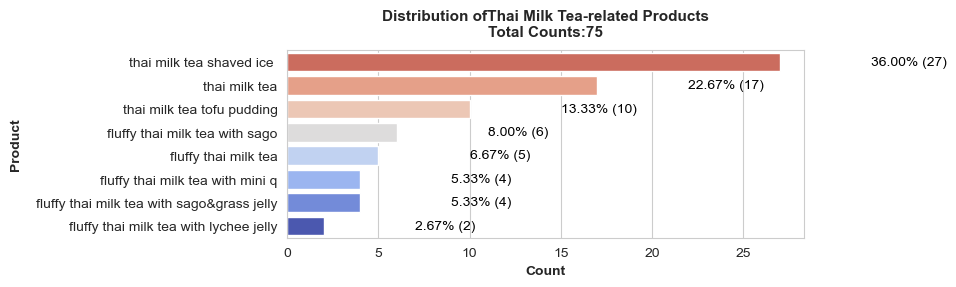

In [181]:
keyword = 'thai'

data = pd.DataFrame(search_monthly_count(keyword)).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[search_count(keyword).index,:]

plt.figure(figsize=(2, 8))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Thai Milk Tea-related Products", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = search_count(keyword)
data_percentages = get_percentage(data)


plt.figure(figsize=(10,5))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold",labelpad=10)
plt.title(f"Distribution ofThai Milk Tea-related Products\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

# 4. Drink Series Analysis

## 4.1 Fluffy Series

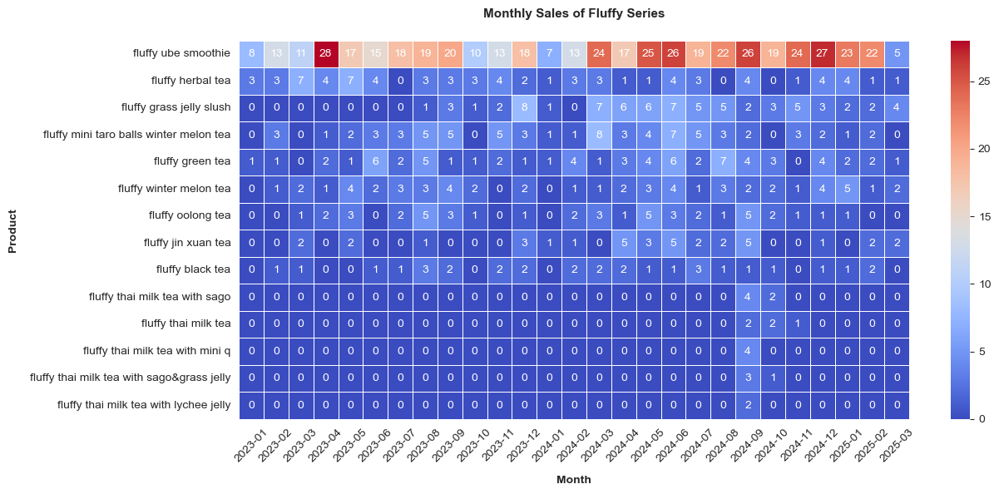

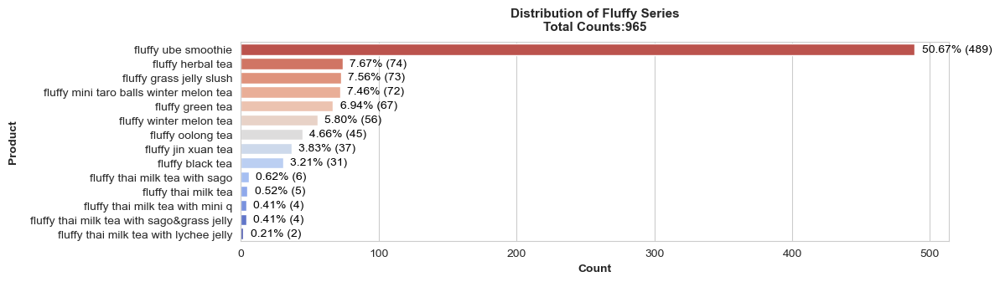

In [36]:
keyword = 'fluffy'

data = pd.DataFrame(search_monthly_count(keyword)).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[search_count(keyword).index,:]

plt.figure(figsize=(13, 13))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Fluffy Series", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = search_count(keyword)
data_percentages = get_percentage(data)


plt.figure(figsize=(12,6))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=10)
plt.title(f"Distribution of Fluffy Series\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

## 4.2 Winter Melon Teas

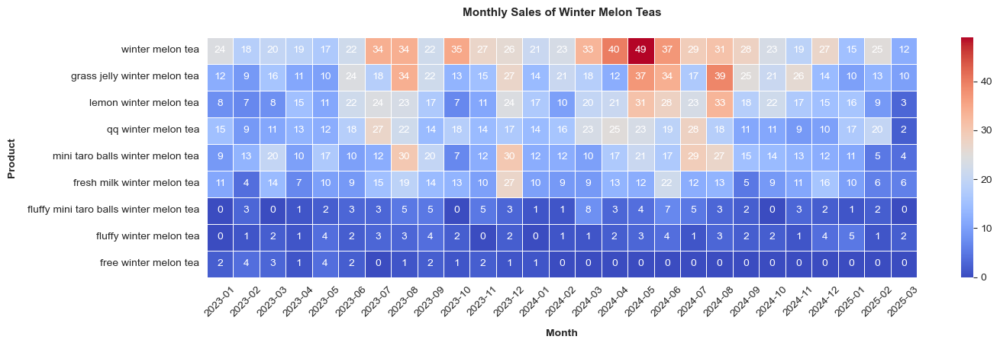

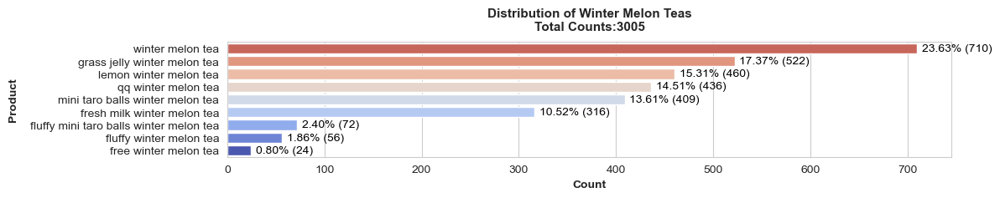

In [38]:
keyword = 'winter melon'

data = pd.DataFrame(search_monthly_count(keyword)).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[search_count(keyword).index,:]

plt.figure(figsize=(15, 9))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Winter Melon Teas", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = search_count(keyword)
data_percentages = get_percentage(data)


plt.figure(figsize=(12,4))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=10)
plt.title(f"Distribution of Winter Melon Teas\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

## 4.3 Herbal Teas

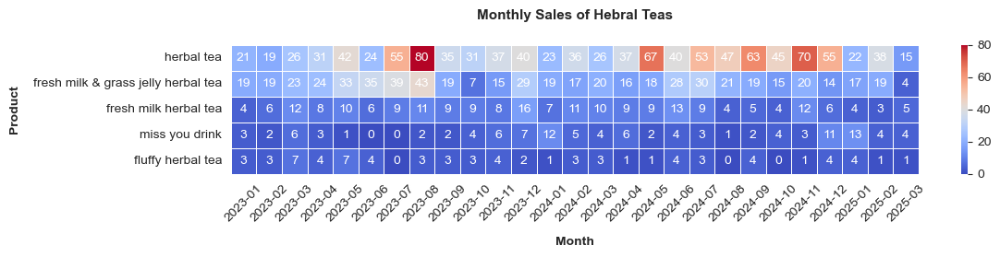

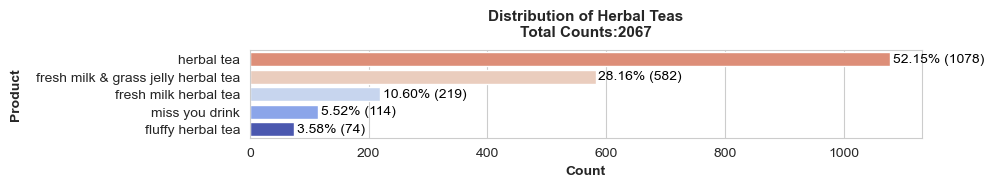

In [43]:
keyword = 'herbal|miss you'

data = pd.DataFrame(search_monthly_count(keyword)).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[search_count(keyword).index,:]

plt.figure(figsize=(12, 4))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Hebral Teas", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = search_count(keyword)
data_percentages = get_percentage(data)


plt.figure(figsize=(10,3))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold",labelpad=10)
plt.title(f"Distribution of Herbal Teas\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

## 4.4 Green/Black/Oolong Teas

### 1) Green Teas

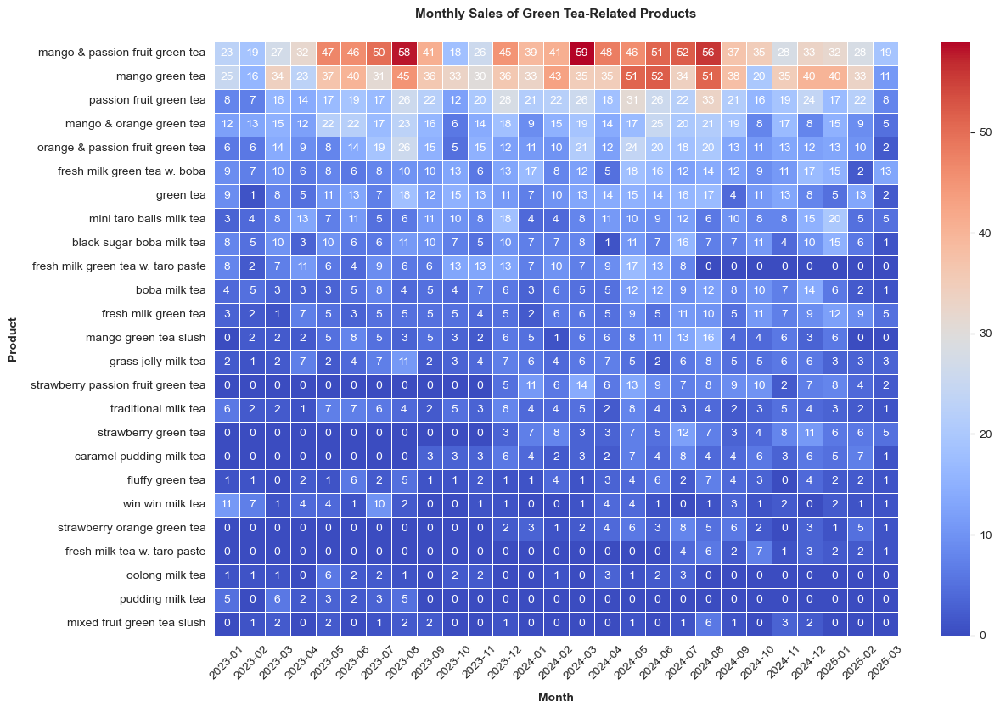

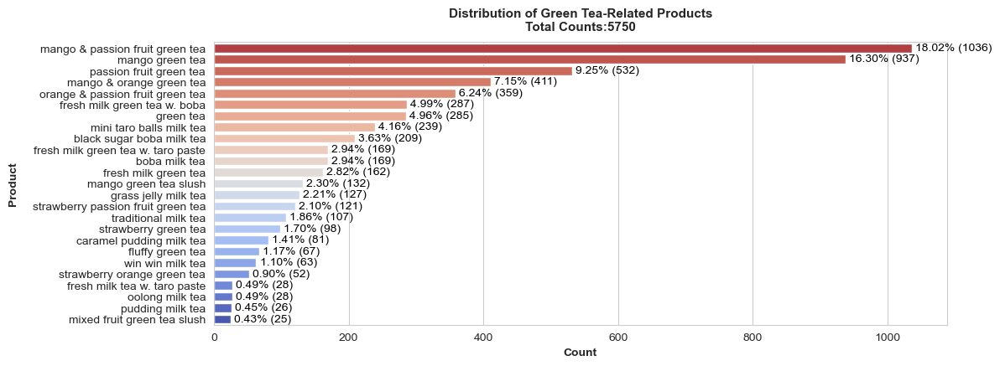

In [47]:
keyword = 'green tea'

data = pd.DataFrame(search_monthly_count(keyword)).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[search_count(keyword).index,:]

plt.figure(figsize=(13, 20))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Green Tea-Related Products", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = search_count(keyword)
data_percentages = get_percentage(data)


plt.figure(figsize=(12,8))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Green Tea-Related Products\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

### 2) Black Teas

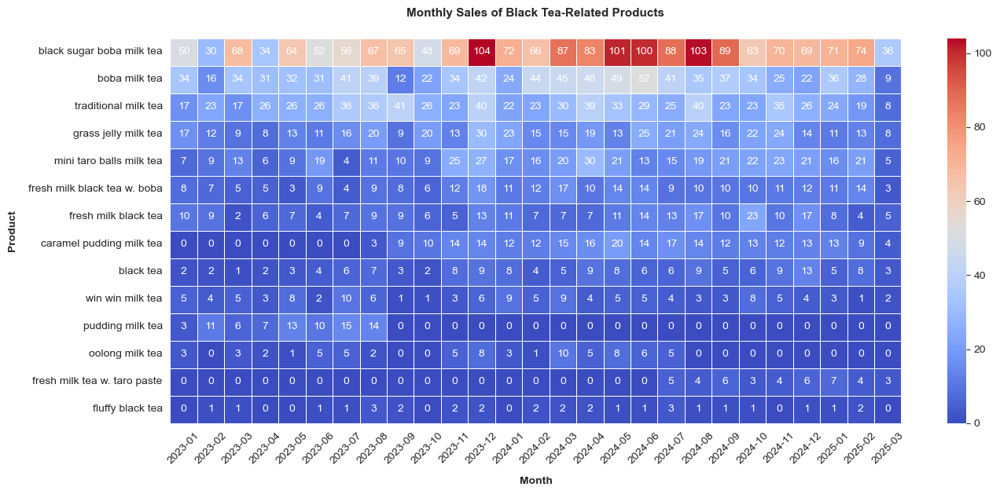

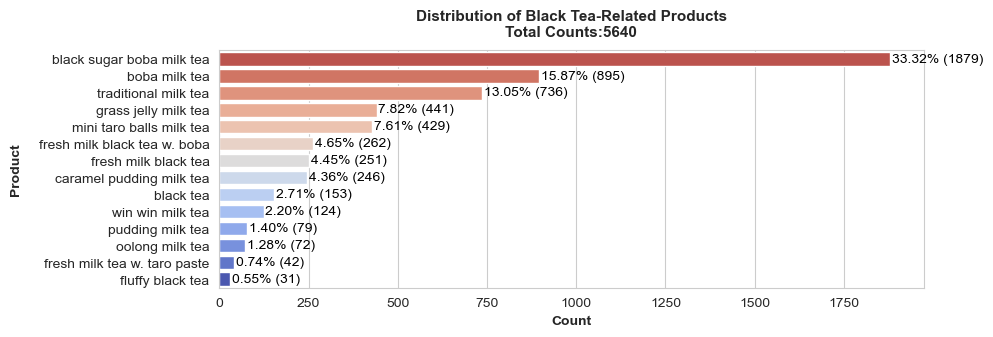

In [51]:
keyword = 'black tea'

data = pd.DataFrame(search_monthly_count(keyword)).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[search_count(keyword).index,:]

plt.figure(figsize=(15, 14))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Black Tea-Related Products", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = search_count(keyword)
data_percentages = get_percentage(data)

plt.figure(figsize=(10,6))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Black Tea-Related Products\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

### 3) Oolong Teas

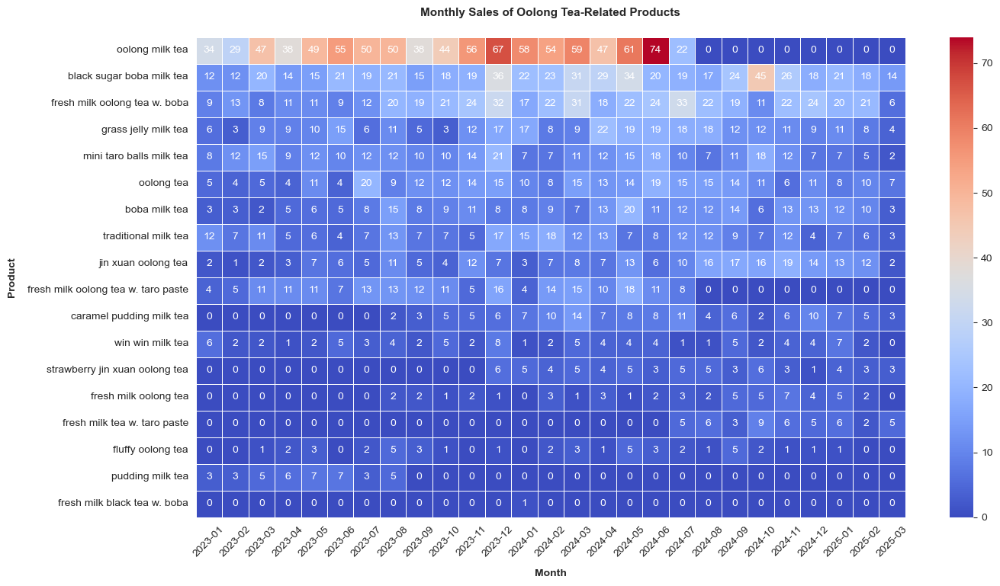

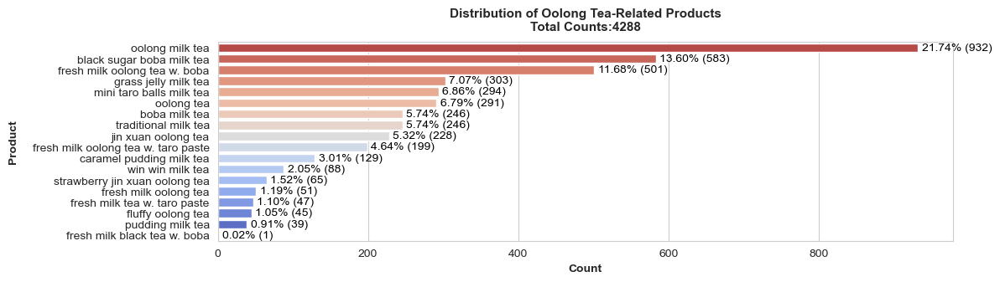

In [54]:
keyword = 'oolong tea'

data = pd.DataFrame(search_monthly_count(keyword)).reset_index().sort_values(by=['Associated Dish','YearMonth'])
data_pivot = data.pivot(index="Associated Dish", columns="YearMonth", values="Count").fillna(0)
data_pivot = data_pivot.loc[search_count(keyword).index,:]

plt.figure(figsize=(15, 18))
plt.subplot(2, 1, 1)
ax = sns.heatmap(data_pivot, cmap="coolwarm", annot=False, fmt=".0f", linewidths=0.5)

# Manually annotate each cell
for i in range(data_pivot.shape[0]):  # Rows
    for j in range(data_pivot.shape[1]):  # Columns
        value = data_pivot.iloc[i, j]
        ax.text(j + 0.5, i + 0.5, f"{int(value)}" if not np.isnan(value) else "", 
                ha="center", va="center", color="white", fontsize=10)

# Add title and labels
plt.title("Monthly Sales of Oolong Tea-Related Products", fontsize=11, fontweight="bold", pad=20)
plt.xlabel("Month", fontsize=10, fontweight="bold", labelpad=10)
plt.ylabel("Product", fontsize=10, fontweight="bold", labelpad=10)
plt.xticks(rotation=45)

plt.show()


data = search_count(keyword)
data_percentages = get_percentage(data)

plt.figure(figsize=(12,6))
plt.subplot(2, 1, 2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))

cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(data.index) - i - 1) / len(data.index)) for i in range(len(data.index))]
# Create bar chart
ax = sns.barplot(x=data.values, y=data.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(data.values, data_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}% ({size})", va='center', fontsize=10, color='black')


# Add labels and title
plt.xlabel("Count", fontweight="bold")
plt.ylabel("Product", fontweight="bold", labelpad=12)
plt.title(f"Distribution of Oolong Tea-Related Products\nTotal Counts:{sum(data)}",fontsize=11, fontweight="bold", pad=10)

plt.tight_layout()
plt.show()

### 4) Tea Comparison

In [55]:
green_tea = search_count('green tea')
black_tea = search_count('black tea')
oolong_tea = search_count('oolong tea')

green_tea_percentages = [size / sum(green_tea) * 100 for size in green_tea.values]
black_tea_percentages = [size / sum(black_tea) * 100 for size in black_tea.values]
oolong_tea_percentages = [size / sum(oolong_tea) * 100 for size in oolong_tea.values]

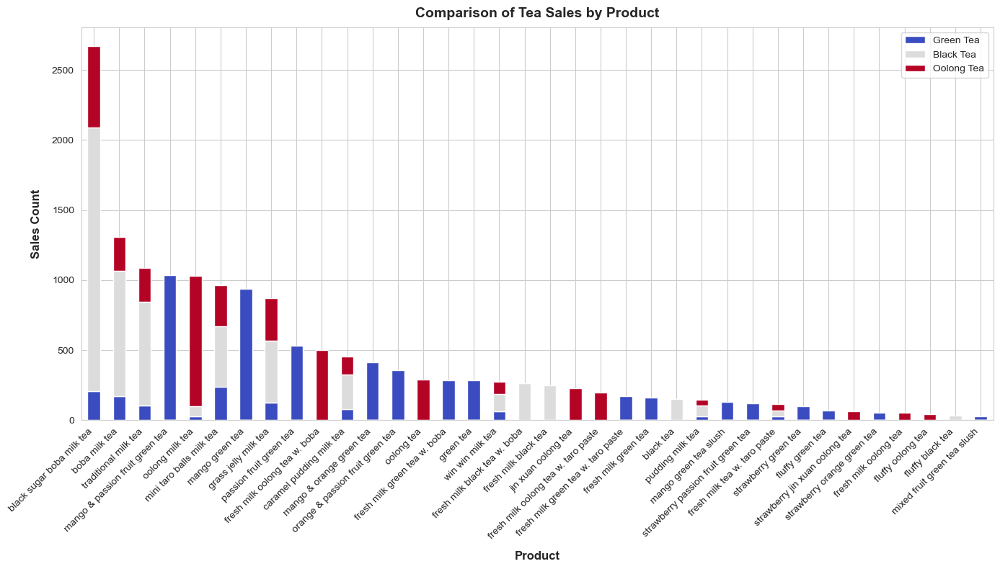

In [56]:
# Combine the data into a DataFrame, aligning by index
tea_sales = pd.DataFrame({
    'Green Tea': green_tea,
    'Black Tea': black_tea,
    'Oolong Tea': oolong_tea
})

# Fill missing values with 0 for products not present in one of the datasets
tea_sales = tea_sales.fillna(0)

# Calculate the total sales for each product
tea_sales['Total Sales'] = tea_sales.sum(axis=1)
# Sort the DataFrame by total sales (in descending order)
tea_sales = tea_sales.sort_values(by='Total Sales', ascending=False)
# Drop the 'Total Sales' column after sorting
tea_sales = tea_sales.drop(columns='Total Sales')

# Plotting the stacked bar chart
tea_sales.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='coolwarm')
plt.title("Comparison of Tea Sales by Product", fontweight='bold', pad=10, fontsize=14)
plt.xlabel("Product", fontweight='bold', labelpad=10, fontsize=12)
plt.ylabel("Sales Count", fontweight='bold', labelpad=10, fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

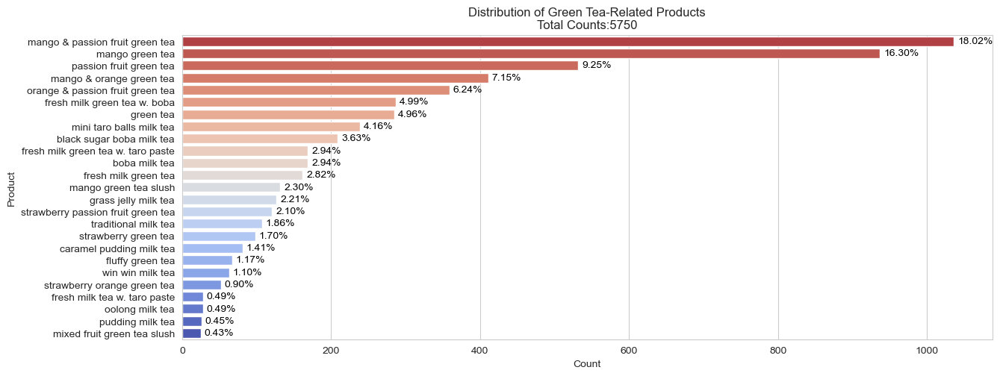

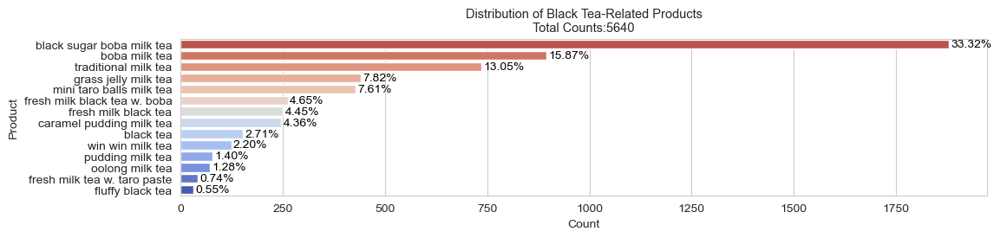

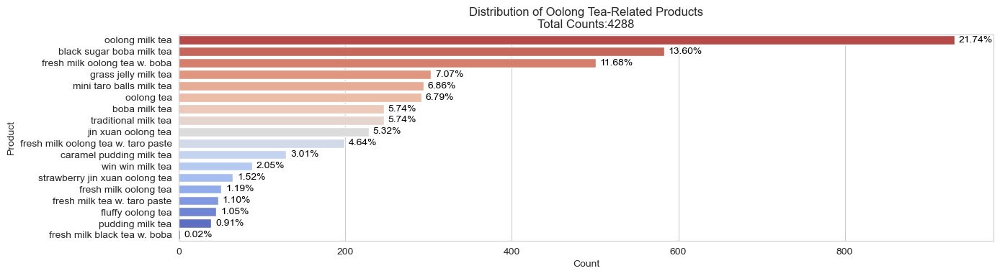

In [57]:
# Set figure size
plt.figure(figsize=(14,18))
plt.subplot(3, 1, 1)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))
cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(green_tea.index) - i - 1) / len(green_tea.index)) for i in range(len(green_tea.index))]
# Create bar chart
ax = sns.barplot(x=green_tea.values, y=green_tea.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(green_tea.values, green_tea_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}%", va='center', fontsize=10, color='black')
# Add labels and title
plt.xlabel("Count")
plt.ylabel("Product")
plt.title(f"Distribution of Green Tea-Related Products\nTotal Counts:{sum(green_tea)}",fontsize=12)

#--------------------------------------------------------------------

# Set figure size
plt.figure(figsize=(12, 8))
plt.subplot(3,1,2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))
cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(black_tea.index) - i - 1) / len(black_tea.index)) for i in range(len(black_tea.index))]
# Create bar chart
ax = sns.barplot(x=black_tea.values, y=black_tea.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(black_tea.values, black_tea_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}%", va='center', fontsize=10, color='black')
# Add labels and title
plt.xlabel("Count")
plt.ylabel("Product")
plt.title(f"Distribution of Black Tea-Related Products\nTotal Counts:{sum(black_tea)}", fontsize=10.5)

#--------------------------------------------------------------------

# Set figure size
plt.figure(figsize=(14, 10))
plt.subplot(3,1,2)
# Get pastel color palette
#colors = sns.color_palette("coolwarm", len(labels))
cmap = plt.get_cmap("coolwarm")
colors = [cmap((len(oolong_tea.index) - i - 1) / len(oolong_tea.index)) for i in range(len(oolong_tea.index))]
# Create bar chart
ax = sns.barplot(x=oolong_tea.values, y=oolong_tea.index, palette=colors)
# Add percentage labels
for i, (size, percent) in enumerate(zip(oolong_tea.values, oolong_tea_percentages)):
    ax.text(size + 5, i, f"{percent:.2f}%", va='center', fontsize=10, color='black')
# Add labels and title
plt.xlabel("Count")
plt.ylabel("Product")
plt.title(f"Distribution of Oolong Tea-Related Products\nTotal Counts:{sum(oolong_tea)}", fontsize=12)

# Show the chart
plt.tight_layout()
plt.show()